# 1. 라이브러리 로드

In [1]:
!pip install koreanize-matplotlib transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 34.4 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import koreanize_matplotlib
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from torch.utils.data import DataLoader, TensorDataset
from torch.utils.tensorboard import SummaryWriter

import warnings
warnings.filterwarnings('ignore')

# 2. 데이터 로드

In [3]:
col_to_use = [
    'region', 'date', 'volume_cnt',
    'avg_area_size', 'avg_sales', 'avg_floor_cnt',

    'pod_index', 'abs_vdd_index', 'canceld_index', 'direct_trade_ratio', 'anomaly_abs_vdd_score',

    'wolse_volume_cnt', 'jeonse_volume_cnt', 'wolse_avg_area_size',
    'jeonse_avg_area_size', 'wolse_avg_deposit', 'jeonse_avg_deposit',
    'wolse_avg_monthly', 'wolse_avg_floor_cnt', 'jeonse_avg_floor_cnt',

    'townhouse_volume_cnt', 'townhouse_avg_area_size',
    'townhouse_avg_sales', 'townhouse_avg_floor_cnt',
    'townhouse_jeonse_volume_cnt', 'townhouse_wolse_avg_area_size',
    'townhouse_jeonse_avg_area_size', 'townhouse_wolse_avg_floor_cnt',
    'townhouse_jeonse_avg_floor_cnt', 'townhouse_wolse_avg_deposit',
    'townhouse_jeonse_avg_deposit', 'townhouse_wolse_avg_monthly',

    'familyhouse_volume_cnt', 'familyhouse_avg_area_size',
    'familyhouse_avg_sales', 'familyhouse_wolse_volume_cnt',
    'familyhouse_jeonse_volume_cnt', 'familyhouse_wolse_avg_area_size',
    'familyhouse_jeonse_avg_area_size', 'familyhouse_wolse_avg_deposit',
    'familyhouse_jeonse_avg_deposit', 'familyhouse_wolse_avg_monthly',

    'officehouse_volume_cnt', 'officehouse_avg_area_size',
    'officehouse_avg_sales', 'officehouse_avg_floor_cnt',
    'officehouse_wolse_volume_cnt', 'officehouse_jeonse_volume_cnt',
    'officehouse_wolse_avg_area_size', 'officehouse_jeonse_avg_area_size',
    'officehouse_wolse_avg_floor_cnt', 'officehouse_jeonse_avg_floor_cnt',
    'officehouse_wolse_avg_deposit', 'officehouse_jeonse_avg_deposit',
    'officehouse_wolse_avg_monthly', 'townhouse_wolse_volume_cnt',

    'is_anomaly_score_outlier_mean_1sigma_win5',
       'is_anomaly_score_outlier_mean_2sigma_win5',
       'is_anomaly_score_outlier_mean_3sigma_win5',
       'is_anomaly_score_outlier_mean_1sigma_win10',
       'is_anomaly_score_outlier_mean_2sigma_win10',
       'is_anomaly_score_outlier_mean_3sigma_win10',
       'is_anomaly_score_outlier_mean_1sigma_win15',
       'is_anomaly_score_outlier_mean_2sigma_win15',
       'is_anomaly_score_outlier_mean_3sigma_win15',
       'is_anomaly_score_outlier_mean_1sigma_win20',
       'is_anomaly_score_outlier_mean_2sigma_win20',
       'is_anomaly_score_outlier_mean_3sigma_win20',
       'is_anomaly_score_outlier_mean_1sigma_win25',
       'is_anomaly_score_outlier_mean_2sigma_win25',
       'is_anomaly_score_outlier_mean_3sigma_win25',
       'is_anomaly_score_outlier_mean_1sigma_win30',
       'is_anomaly_score_outlier_mean_2sigma_win30',
       'is_anomaly_score_outlier_mean_3sigma_win30'
]

In [4]:
apt_volume_train_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_train_anomaly_score_label_combi3.csv')[col_to_use]
apt_volume_valid_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_valid_anomaly_score_label_combi3.csv')[col_to_use]
apt_volume_test_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_label_combi3.csv')[col_to_use]

In [5]:
len(apt_volume_train_df), len(apt_volume_valid_df), len(apt_volume_test_df)

(20550, 3025, 5350)

# 3. 데이터 전처리
* Set	기간	개월 수

In [6]:
def scale_features_from_split(train_df, valid_df, test_df, features, target_col=None, target_clean_col=None):
    """
    train_df 기준으로 MinMaxScaler fit 후 전체 transform.
    - train/valid: 보정된 종속변수 target_clean_col 기준으로 transform
    - test: 원본 종속변수 target_col 기준으로 transform
    - 반환되는 결과는 모두 DataFrame
    """

    # 👉 fit 시 사용할 feature + 보정된 target 컬럼
    train_df_copy = train_df.copy()[features + [target_col]].rename(columns={target_col: 'target'})
    valid_df_copy = valid_df.copy()[features + [target_col]].rename(columns={target_col: 'target'})
    test_df_copy  = test_df.copy()[features + [target_col]].rename(columns={target_col: 'target'})

    # 👉 fit
    scaler = MinMaxScaler()
    scaler.fit(train_df_copy)

    # 👉 transform (np.ndarray 반환됨)
    train_scaled_vals = scaler.transform(train_df_copy)
    valid_scaled_vals = scaler.transform(valid_df_copy)
    test_scaled_vals  = scaler.transform(test_df_copy)

    # 👉 컬럼명 구성: features + 'target'
    scaled_columns = features + ['target']

    # 👉 DataFrame으로 복구
    train_scaled_df = pd.DataFrame(train_scaled_vals, columns=scaled_columns, index=train_df.index)
    valid_scaled_df = pd.DataFrame(valid_scaled_vals, columns=scaled_columns, index=valid_df.index)
    test_scaled_df  = pd.DataFrame(test_scaled_vals,  columns=scaled_columns, index=test_df.index)

    # 🟡 'date' 컬럼 유지
    for df_orig, df_scaled in zip([train_df, valid_df, test_df], [train_scaled_df, valid_scaled_df, test_scaled_df]):
        if ("date" in df_orig.columns) and ('region' in df_orig.columns):
            df_scaled["date"] = df_orig["date"]
            df_scaled["region"] = df_orig["region"]

    return train_scaled_df, valid_scaled_df, test_scaled_df, scaler


In [7]:
def generate_time_features(dates: pd.Series) -> np.ndarray:
    """
    날짜 Series를 받아 시간 특성 (month, day, weekday, dayofyear) 생성
    """
    dates = pd.to_datetime(dates)

    features = np.stack([
        dates.dt.month / 12.0,
        dates.dt.day / 31.0,
        dates.dt.weekday / 6.0,
        dates.dt.dayofyear / 366.0
    ], axis=1)

    return features  # shape: [len(dates), 4]

In [8]:
# 📌 시계열 window 데이터셋 생성 함수
def create_autoformer_dataset(df, feature_cols, target_col, region_col, date_col,
                            input_len=30, label_len=15, pred_len=15):
    """
    Informer 입력에 맞게 window 기반 데이터셋 생성
    반환: x_enc, x_dec, y, region_id, x_mark_enc, x_mark_dec
    """
    x_enc_all, x_dec_all, y_all, region_ids = [], [], [], []
    x_mark_enc_all, x_mark_dec_all = [], []

    total_window = input_len + pred_len
    for i in range(len(df) - total_window + 1):
        enc_window = df.iloc[i:i+input_len]
        dec_input = df.iloc[i+input_len-label_len:i+input_len+pred_len]
        y = df[target_col].iloc[i+input_len:i+input_len+pred_len].values

        # Feature 입력
        x_enc = enc_window[feature_cols].values
        x_dec = dec_input[feature_cols].copy().values
        x_dec[label_len:] = 0  # 미래 구간은 zero

        # 시간 마킹 입력
        x_mark_enc = generate_time_features(enc_window[date_col])
        x_mark_dec = generate_time_features(dec_input[date_col])

        # 저장
        x_enc_all.append(x_enc)
        x_dec_all.append(x_dec)
        y_all.append(y)
        region_ids.append(df[region_col].iloc[i])
        x_mark_enc_all.append(x_mark_enc)
        x_mark_dec_all.append(x_mark_dec)

    return (
        np.array(x_enc_all),         # [N, input_len, C]
        np.array(x_dec_all),         # [N, label_len+pred_len, C]
        np.array(y_all),             # [N, pred_len]
        np.array(region_ids),        # [N]
        np.array(x_mark_enc_all),    # [N, input_len, T]
        np.array(x_mark_dec_all)     # [N, label_len+pred_len, T]
    )

In [9]:
# # 📌 시계열 split 함수 (6:2:2 기준)
# def timeseries_split(df, train_periods, valid_periods, test_periods):
#     """
#     시계열 데이터를 6:2:2로 split
#     """
#     train_df = df.query(f"date >= '{train_periods[0]}' and date <= '{train_periods[1]}'")
#     valid_df = df.query(f"date >= '{valid_periods[0]}' and date <= '{valid_periods[1]}'")
#     test_df = df.query(f"date >= '{test_periods[0]}' and date <= '{test_periods[1]}'")

#     return train_df, valid_df, test_df

In [10]:
def build_autoformer_datasets_from_split(
    train_df,
    valid_df,
    test_df,
    feature_cols,
    region_col,
    input_len=30,
    label_len=15,
    pred_len=5
):

    region2idx = {r: i for i, r in enumerate(pd.concat([train_df, valid_df, test_df])[region_col].unique())}
    region_scalers = {}

    data = {
        "train": {"x_enc": [], "x_dec": [], "y": [], "region": [], "x_mark_enc": [], "x_mark_dec": []},
        "val":   {"x_enc": [], "x_dec": [], "y": [], "region": [], "x_mark_enc": [], "x_mark_dec": []},
        "test":  {"x_enc": [], "x_dec": [], "y": [], "region": [], "x_mark_enc": [], "x_mark_dec": []}
    }

    df_train_all, df_val_all, df_test_all = [], [], []

    for region in region2idx.keys():
        region_id = region2idx[region]

        # 지역별 분리
        train_r = train_df[train_df[region_col] == region].sort_values("date").reset_index(drop=True)
        valid_r = valid_df[valid_df[region_col] == region].sort_values("date").reset_index(drop=True)
        test_r = test_df[test_df[region_col] == region].sort_values("date").reset_index(drop=True)

        # 스케일링: train/valid은 volume_cnt_clean 기준, test는 원본 volume_cnt 기준
        scaled_train, scaled_valid, scaled_test, scaler = scale_features_from_split(
            train_df=train_r,
            valid_df=valid_r,
            test_df=test_r,
            features=feature_cols,
            target_col="volume_cnt",
            target_clean_col="volume_cnt_scaled"
        )
        region_scalers[region] = scaler

        # 👉 target 컬럼명을 'volume_cnt_scaled'로 변경
        scaled_train = scaled_train.rename(columns={"target": "volume_cnt"})
        scaled_valid = scaled_valid.rename(columns={"target": "volume_cnt"})
        scaled_test  = scaled_test.rename(columns={"target": "volume_cnt"})  # test는 원래 컬럼명 유지

        df_train_all.append(scaled_train)
        df_val_all.append(scaled_valid)
        df_test_all.append(scaled_test)

        for split_name, df_split, target_col in [
            ("train", scaled_train, "volume_cnt"),
            ("val", scaled_valid, "volume_cnt"),
            ("test", scaled_test, "volume_cnt")
        ]:
            x_enc, x_dec, y, _, x_mark_enc, x_mark_dec = create_autoformer_dataset(
                df_split,
                feature_cols=feature_cols,
                target_col=target_col,
                region_col=region_col,
                date_col="date",
                input_len=input_len,
                label_len=label_len,
                pred_len=pred_len
            )

            data[split_name]["x_enc"].append(x_enc)
            data[split_name]["x_dec"].append(x_dec)
            data[split_name]["y"].append(y)
            data[split_name]["x_mark_enc"].append(x_mark_enc)
            data[split_name]["x_mark_dec"].append(x_mark_dec)
            data[split_name]["region"].extend([region_id] * len(x_enc))

    # 병합
    for split in ["train", "val", "test"]:
        for key in ["x_enc", "x_dec", "y", "x_mark_enc", "x_mark_dec"]:
            data[split][key] = np.concatenate(data[split][key], axis=0)
        data[split]["region"] = np.array(data[split]["region"])

    origin_df_dic = {
        "train": pd.concat(df_train_all, ignore_index=True),
        "val": pd.concat(df_val_all, ignore_index=True),
        "test": pd.concat(df_test_all, ignore_index=True)
    }

    return data, region_scalers, region2idx, origin_df_dic


In [11]:
feature_cols = [
                  'avg_area_size', 'avg_sales', 'avg_floor_cnt',

                  'pod_index', 'abs_vdd_index', 'canceld_index', 'direct_trade_ratio', 'anomaly_abs_vdd_score',

                  'wolse_volume_cnt', 'jeonse_volume_cnt', 'wolse_avg_area_size',
                  'jeonse_avg_area_size', 'wolse_avg_deposit', 'jeonse_avg_deposit',
                  'wolse_avg_monthly', 'wolse_avg_floor_cnt', 'jeonse_avg_floor_cnt',

                  'townhouse_volume_cnt', 'townhouse_avg_area_size',
                  'townhouse_avg_sales', 'townhouse_avg_floor_cnt',
                  'townhouse_jeonse_volume_cnt', 'townhouse_wolse_avg_area_size',
                  'townhouse_jeonse_avg_area_size', 'townhouse_wolse_avg_floor_cnt',
                  'townhouse_jeonse_avg_floor_cnt', 'townhouse_wolse_avg_deposit',
                  'townhouse_jeonse_avg_deposit', 'townhouse_wolse_avg_monthly',

                  'familyhouse_volume_cnt', 'familyhouse_avg_area_size',
                  'familyhouse_avg_sales', 'familyhouse_wolse_volume_cnt',
                  'familyhouse_jeonse_volume_cnt', 'familyhouse_wolse_avg_area_size',
                  'familyhouse_jeonse_avg_area_size', 'familyhouse_wolse_avg_deposit',
                  'familyhouse_jeonse_avg_deposit', 'familyhouse_wolse_avg_monthly',

                  'officehouse_volume_cnt', 'officehouse_avg_area_size',
                  'officehouse_avg_sales', 'officehouse_avg_floor_cnt',
                  'officehouse_wolse_volume_cnt', 'officehouse_jeonse_volume_cnt',
                  'officehouse_wolse_avg_area_size', 'officehouse_jeonse_avg_area_size',
                  'officehouse_wolse_avg_floor_cnt', 'officehouse_jeonse_avg_floor_cnt',
                  'officehouse_wolse_avg_deposit', 'officehouse_jeonse_avg_deposit',
                  'officehouse_wolse_avg_monthly', 'townhouse_wolse_volume_cnt'
              ]

# is_anomaly_score_outlier, is_anomaly_score_outlier_25.0%, is_anomaly_score_outlier_15.0%, is_anomaly_score_outlier_5.0%

# train, valid set은 정상 라벨 데이터만 반영
anomaly_score_label_col = 'is_anomaly_score_outlier_mean_2sigma_win30'
data_dict, scaler, region2idx, origin_df_dic = build_autoformer_datasets_from_split(
                                                                            train_df=apt_volume_train_df[apt_volume_train_df[f'{anomaly_score_label_col}'] == 0],
                                                                            valid_df=apt_volume_valid_df[apt_volume_train_df[f'{anomaly_score_label_col}'] == 0],
                                                                            test_df=apt_volume_test_df,
                                                                            feature_cols=feature_cols,
                                                                            region_col='region',
                                                                            input_len=30,
                                                                            label_len=10,
                                                                            pred_len=1
                                                                        )


In [12]:
len(apt_volume_train_df), len(apt_volume_valid_df), len(apt_volume_test_df)

(20550, 3025, 5350)

In [13]:
len(origin_df_dic['train']), len(origin_df_dic['val']), len(origin_df_dic['test'])

(19371, 2848, 5350)

In [14]:
# 📌 TRAIN SET
X_train_enc = data_dict['train']['x_enc']
X_train_dec = data_dict['train']['x_dec']
y_train     = data_dict['train']['y']
region_train = data_dict['train']['region']
X_mark_enc_train = data_dict['train']['x_mark_enc']
X_mark_dec_train = data_dict['train']['x_mark_dec']

# 📌 VALIDATION SET
X_val_enc = data_dict['val']['x_enc']
X_val_dec = data_dict['val']['x_dec']
y_val     = data_dict['val']['y']
region_val = data_dict['val']['region']
X_mark_enc_val = data_dict['val']['x_mark_enc']
X_mark_dec_val = data_dict['val']['x_mark_dec']

# 📌 TEST SET
X_test_enc = data_dict['test']['x_enc']
X_test_dec = data_dict['test']['x_dec']
y_test     = data_dict['test']['y']
region_test = data_dict['test']['region']
X_mark_enc_test = data_dict['test']['x_mark_enc']
X_mark_dec_test = data_dict['test']['x_mark_dec']

# 4. Torch Dataset 구성

In [15]:
import torch
from torch.utils.data import Dataset

class AutoformerRegionDataset(Dataset):
    def __init__(self, x_enc, x_dec, y, region_ids, x_mark_enc, x_mark_dec):
        """
        x_enc:        [N, input_len, num_features]
        x_dec:        [N, label_len + pred_len, num_features]
        y:            [N, pred_len]
        region_ids:   [N]
        x_mark_enc:   [N, input_len, time_feature_dim]
        x_mark_dec:   [N, label_len + pred_len, time_feature_dim]
        """
        self.x_enc = x_enc
        self.x_dec = x_dec
        self.y = y
        self.region_ids = region_ids
        self.x_mark_enc = x_mark_enc
        self.x_mark_dec = x_mark_dec

    def __len__(self):
        return len(self.x_enc)

    def __getitem__(self, idx):
        x_enc = torch.tensor(self.x_enc[idx], dtype=torch.float32)
        x_dec = torch.tensor(self.x_dec[idx], dtype=torch.float32)
        y = torch.tensor(self.y[idx], dtype=torch.float32)
        region_id = torch.tensor(self.region_ids[idx], dtype=torch.long)
        x_mark_enc = torch.tensor(self.x_mark_enc[idx], dtype=torch.float32)
        x_mark_dec = torch.tensor(self.x_mark_dec[idx], dtype=torch.float32)

        return x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id


In [16]:
batch_size = 64

# ✅ Train
train_dataset = AutoformerRegionDataset(
    X_train_enc, X_train_dec, y_train, region_train,
    X_mark_enc_train, X_mark_dec_train
)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

# ✅ Validation
val_dataset = AutoformerRegionDataset(
    X_val_enc, X_val_dec, y_val, region_val,
    X_mark_enc_val, X_mark_dec_val
)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# ✅ Test
test_dataset = AutoformerRegionDataset(
    X_test_enc, X_test_dec, y_test, region_test,
    X_mark_enc_test, X_mark_dec_test
)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [17]:
for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in train_loader:

    print("x_enc:", x_enc.shape)       # [64, 30, feature_dim]
    print("x_mark_enc:", x_mark_enc.shape)  # [64]

    print("x_dec:", x_dec.shape)       # [64, 30, feature_dim]
    print("x_mark_dec:", x_mark_dec.shape)  # [64]

    print("y:", y.shape)               # [64,] or [64, pred_len]
    print("region_id:", region_id.shape)  # [64]
    break

x_enc: torch.Size([64, 30, 53])
x_mark_enc: torch.Size([64, 30, 4])
x_dec: torch.Size([64, 11, 53])
x_mark_dec: torch.Size([64, 11, 4])
y: torch.Size([64, 1])
region_id: torch.Size([64])


# 5. Autoformer Model

In [18]:
import math

def compared_version(ver1, ver2):
    """
    :param ver1
    :param ver2
    :return: ver1< = >ver2 False/True
    """
    list1 = str(ver1).split(".")
    list2 = str(ver2).split(".")

    for i in range(len(list1)) if len(list1) < len(list2) else range(len(list2)):
        if int(list1[i]) == int(list2[i]):
            pass
        elif int(list1[i]) < int(list2[i]):
            return -1
        else:
            return 1

    if len(list1) == len(list2):
        return True
    elif len(list1) < len(list2):
        return False
    else:
        return True

class PositionalEmbedding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super(PositionalEmbedding, self).__init__()
        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model).float()
        pe.require_grad = False

        position = torch.arange(0, max_len).float().unsqueeze(1)
        div_term = (torch.arange(0, d_model, 2).float() * -(math.log(10000.0) / d_model)).exp()

        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)

        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        return self.pe[:, :x.size(1)]


class TokenEmbedding(nn.Module):
    def __init__(self, c_in, d_model):
        super(TokenEmbedding, self).__init__()
        padding = 1 if compared_version(torch.__version__, '1.5.0') else 2
        self.tokenConv = nn.Conv1d(in_channels=c_in, out_channels=d_model,
                                   kernel_size=3, padding=padding, padding_mode='circular', bias=False)
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')

    def forward(self, x):
        x = self.tokenConv(x.permute(0, 2, 1)).transpose(1, 2)
        return x


class FixedEmbedding(nn.Module):
    def __init__(self, c_in, d_model):
        super(FixedEmbedding, self).__init__()

        w = torch.zeros(c_in, d_model).float()
        w.require_grad = False

        position = torch.arange(0, c_in).float().unsqueeze(1)
        div_term = (torch.arange(0, d_model, 2).float() * -(math.log(10000.0) / d_model)).exp()

        w[:, 0::2] = torch.sin(position * div_term)
        w[:, 1::2] = torch.cos(position * div_term)

        self.emb = nn.Embedding(c_in, d_model)
        self.emb.weight = nn.Parameter(w, requires_grad=False)

    def forward(self, x):
        return self.emb(x).detach()


class TemporalEmbedding(nn.Module):
    def __init__(self, d_model, embed_type='fixed', freq='h'):
        super(TemporalEmbedding, self).__init__()

        minute_size = 4
        hour_size = 24
        weekday_size = 7
        day_size = 32
        month_size = 13

        Embed = FixedEmbedding if embed_type == 'fixed' else nn.Embedding
        if freq == 't':
            self.minute_embed = Embed(minute_size, d_model)
        self.hour_embed = Embed(hour_size, d_model)
        self.weekday_embed = Embed(weekday_size, d_model)
        self.day_embed = Embed(day_size, d_model)
        self.month_embed = Embed(month_size, d_model)

    def forward(self, x):
        x = x.long()

        minute_x = self.minute_embed(x[:, :, 4]) if hasattr(self, 'minute_embed') else 0.
        hour_x = self.hour_embed(x[:, :, 3])
        weekday_x = self.weekday_embed(x[:, :, 2])
        day_x = self.day_embed(x[:, :, 1])
        month_x = self.month_embed(x[:, :, 0])

        return hour_x + weekday_x + day_x + month_x + minute_x


class TimeFeatureEmbedding(nn.Module):
    def __init__(self, d_model, embed_type='timeF', freq='h'):
        super(TimeFeatureEmbedding, self).__init__()

        freq_map = {'h': 4, 't': 5, 's': 6, 'm': 1, 'a': 1, 'w': 2, 'd': 3, 'b': 3}
        d_inp = freq_map[freq]
        self.embed = nn.Linear(d_inp, d_model, bias=False)

    def forward(self, x):
        return self.embed(x)


class DataEmbedding(nn.Module):
    def __init__(self, c_in, d_model, embed_type='fixed', freq='h', dropout=0.1):
        super(DataEmbedding, self).__init__()

        self.value_embedding = TokenEmbedding(c_in=c_in, d_model=d_model)
        self.position_embedding = PositionalEmbedding(d_model=d_model)
        self.temporal_embedding = TemporalEmbedding(d_model=d_model, embed_type=embed_type,
                                                    freq=freq) if embed_type != 'timeF' else TimeFeatureEmbedding(
            d_model=d_model, embed_type=embed_type, freq=freq)
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, x, x_mark):
        x = self.value_embedding(x) + self.temporal_embedding(x_mark) + self.position_embedding(x)
        return self.dropout(x)


class DataEmbedding_wo_pos(nn.Module):
    def __init__(self, c_in, d_model, embed_type='fixed', freq='h', dropout=0.1):
        super(DataEmbedding_wo_pos, self).__init__()

        self.value_embedding = TokenEmbedding(c_in=c_in, d_model=d_model)
        self.position_embedding = PositionalEmbedding(d_model=d_model)
        self.temporal_embedding = TemporalEmbedding(d_model=d_model, embed_type=embed_type,
                                                    freq=freq) if embed_type != 'timeF' else TimeFeatureEmbedding(
            d_model=d_model, embed_type=embed_type, freq=freq)
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, x, x_mark):
        x = self.value_embedding(x) + self.temporal_embedding(x_mark)
        return self.dropout(x)

In [19]:
class AutoCorrelation(nn.Module):
    """
    AutoCorrelation Mechanism with the following two phases:
    (1) period-based dependencies discovery
    (2) time delay aggregation
    This block can replace the self-attention family mechanism seamlessly.
    """
    def __init__(self, mask_flag=True, factor=1, scale=None, attention_dropout=0.1, output_attention=False):
        super(AutoCorrelation, self).__init__()
        self.factor = factor
        self.scale = scale
        self.mask_flag = mask_flag
        self.output_attention = output_attention
        self.dropout = nn.Dropout(attention_dropout)

    def time_delay_agg_training(self, values, corr):
        """
        SpeedUp version of Autocorrelation (a batch-normalization style design)
        This is for the training phase.
        """
        head = values.shape[1]
        channel = values.shape[2]
        length = values.shape[3]
        # find top k
        top_k = int(self.factor * math.log(length))
        mean_value = torch.mean(torch.mean(corr, dim=1), dim=1)
        index = torch.topk(torch.mean(mean_value, dim=0), top_k, dim=-1)[1]
        weights = torch.stack([mean_value[:, index[i]] for i in range(top_k)], dim=-1)
        # update corr
        tmp_corr = torch.softmax(weights, dim=-1)
        # aggregation
        tmp_values = values
        delays_agg = torch.zeros_like(values).float()
        for i in range(top_k):
            pattern = torch.roll(tmp_values, -int(index[i]), -1)
            delays_agg = delays_agg + pattern * \
                         (tmp_corr[:, i].unsqueeze(1).unsqueeze(1).unsqueeze(1).repeat(1, head, channel, length))
        return delays_agg

    def time_delay_agg_inference(self, values, corr):
        """
        SpeedUp version of Autocorrelation (a batch-normalization style design)
        This is for the inference phase.
        """
        batch = values.shape[0]
        head = values.shape[1]
        channel = values.shape[2]
        length = values.shape[3]
        # index init
        init_index = torch.arange(length).unsqueeze(0).unsqueeze(0).unsqueeze(0)\
            .repeat(batch, head, channel, 1).to(values.device)
        # find top k
        top_k = int(self.factor * math.log(length))
        mean_value = torch.mean(torch.mean(corr, dim=1), dim=1)
        weights, delay = torch.topk(mean_value, top_k, dim=-1)
        # update corr
        tmp_corr = torch.softmax(weights, dim=-1)
        # aggregation
        tmp_values = values.repeat(1, 1, 1, 2)
        delays_agg = torch.zeros_like(values).float()
        for i in range(top_k):
            tmp_delay = init_index + delay[:, i].unsqueeze(1).unsqueeze(1).unsqueeze(1).repeat(1, head, channel, length)
            pattern = torch.gather(tmp_values, dim=-1, index=tmp_delay)
            delays_agg = delays_agg + pattern * \
                         (tmp_corr[:, i].unsqueeze(1).unsqueeze(1).unsqueeze(1).repeat(1, head, channel, length))
        return delays_agg

    def time_delay_agg_full(self, values, corr):
        """
        Standard version of Autocorrelation
        """
        batch = values.shape[0]
        head = values.shape[1]
        channel = values.shape[2]
        length = values.shape[3]
        # index init
        init_index = torch.arange(length).unsqueeze(0).unsqueeze(0).unsqueeze(0)\
            .repeat(batch, head, channel, 1).to(values.device)
        # find top k
        top_k = int(self.factor * math.log(length))
        weights, delay = torch.topk(corr, top_k, dim=-1)
        # update corr
        tmp_corr = torch.softmax(weights, dim=-1)
        # aggregation
        tmp_values = values.repeat(1, 1, 1, 2)
        delays_agg = torch.zeros_like(values).float()
        for i in range(top_k):
            tmp_delay = init_index + delay[..., i].unsqueeze(-1)
            pattern = torch.gather(tmp_values, dim=-1, index=tmp_delay)
            delays_agg = delays_agg + pattern * (tmp_corr[..., i].unsqueeze(-1))
        return delays_agg

    def forward(self, queries, keys, values, attn_mask):
        B, L, H, E = queries.shape
        _, S, _, D = values.shape
        if L > S:
            zeros = torch.zeros_like(queries[:, :(L - S), :]).float()
            values = torch.cat([values, zeros], dim=1)
            keys = torch.cat([keys, zeros], dim=1)
        else:
            values = values[:, :L, :, :]
            keys = keys[:, :L, :, :]

        # period-based dependencies
        q_fft = torch.fft.rfft(queries.permute(0, 2, 3, 1).contiguous(), dim=-1)
        k_fft = torch.fft.rfft(keys.permute(0, 2, 3, 1).contiguous(), dim=-1)
        res = q_fft * torch.conj(k_fft)
        corr = torch.fft.irfft(res, n=L, dim=-1)

        # time delay agg
        if self.training:
            V = self.time_delay_agg_training(values.permute(0, 2, 3, 1).contiguous(), corr).permute(0, 3, 1, 2)
        else:
            V = self.time_delay_agg_inference(values.permute(0, 2, 3, 1).contiguous(), corr).permute(0, 3, 1, 2)

        if self.output_attention:
            return (V.contiguous(), corr.permute(0, 3, 1, 2))
        else:
            return (V.contiguous(), None)

In [20]:
class AutoCorrelationLayer(nn.Module):
    def __init__(self, correlation, d_model, n_heads, d_keys=None,
                 d_values=None):
        super(AutoCorrelationLayer, self).__init__()

        d_keys = d_keys or (d_model // n_heads)
        d_values = d_values or (d_model // n_heads)

        self.inner_correlation = correlation
        self.query_projection = nn.Linear(d_model, d_keys * n_heads)
        self.key_projection = nn.Linear(d_model, d_keys * n_heads)
        self.value_projection = nn.Linear(d_model, d_values * n_heads)
        self.out_projection = nn.Linear(d_values * n_heads, d_model)
        self.n_heads = n_heads

    def forward(self, queries, keys, values, attn_mask):
        B, L, _ = queries.shape
        _, S, _ = keys.shape
        H = self.n_heads

        queries = self.query_projection(queries).view(B, L, H, -1)
        keys = self.key_projection(keys).view(B, S, H, -1)
        values = self.value_projection(values).view(B, S, H, -1)

        out, attn = self.inner_correlation(
            queries,
            keys,
            values,
            attn_mask
        )
        out = out.view(B, L, -1)

        return self.out_projection(out), attn

In [21]:
class my_Layernorm(nn.Module):
    """
    Special designed layernorm for the seasonal part
    """
    def __init__(self, channels):
        super(my_Layernorm, self).__init__()
        self.layernorm = nn.LayerNorm(channels)

    def forward(self, x):
        x_hat = self.layernorm(x)
        bias = torch.mean(x_hat, dim=1).unsqueeze(1).repeat(1, x.shape[1], 1)
        return x_hat - bias


class moving_avg(nn.Module):
    """
    Moving average block to highlight the trend of time series
    """
    def __init__(self, kernel_size, stride):
        super(moving_avg, self).__init__()
        self.kernel_size = kernel_size
        self.avg = nn.AvgPool1d(kernel_size=kernel_size, stride=stride, padding=0)

    def forward(self, x):
        # padding on the both ends of time series
        front = x[:, 0:1, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        end = x[:, -1:, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        x = torch.cat([front, x, end], dim=1)
        x = self.avg(x.permute(0, 2, 1))
        x = x.permute(0, 2, 1)
        return x


class series_decomp(nn.Module):
    """
    Series decomposition block
    """
    def __init__(self, kernel_size):
        super(series_decomp, self).__init__()
        self.moving_avg = moving_avg(kernel_size, stride=1)

    def forward(self, x):
        moving_mean = self.moving_avg(x)
        res = x - moving_mean
        return res, moving_mean


class EncoderLayer(nn.Module):
    """
    Autoformer encoder layer with the progressive decomposition architecture
    """
    def __init__(self, attention, d_model, d_ff=None, moving_avg=25, dropout=0.1, activation="relu"):
        super(EncoderLayer, self).__init__()
        d_ff = d_ff or 4 * d_model
        self.attention = attention
        self.conv1 = nn.Conv1d(in_channels=d_model, out_channels=d_ff, kernel_size=1, bias=False)
        self.conv2 = nn.Conv1d(in_channels=d_ff, out_channels=d_model, kernel_size=1, bias=False)
        self.decomp1 = series_decomp(moving_avg)
        self.decomp2 = series_decomp(moving_avg)
        self.dropout = nn.Dropout(dropout)
        self.activation = F.relu if activation == "relu" else F.gelu

    def forward(self, x, attn_mask=None):
        new_x, attn = self.attention(
            x, x, x,
            attn_mask=attn_mask
        )
        x = x + self.dropout(new_x)
        x, _ = self.decomp1(x)
        y = x
        y = self.dropout(self.activation(self.conv1(y.transpose(-1, 1))))
        y = self.dropout(self.conv2(y).transpose(-1, 1))
        res, _ = self.decomp2(x + y)
        return res, attn


class Encoder(nn.Module):
    """
    Autoformer encoder
    """
    def __init__(self, attn_layers, conv_layers=None, norm_layer=None):
        super(Encoder, self).__init__()
        self.attn_layers = nn.ModuleList(attn_layers)
        self.conv_layers = nn.ModuleList(conv_layers) if conv_layers is not None else None
        self.norm = norm_layer

    def forward(self, x, attn_mask=None):
        attns = []
        if self.conv_layers is not None:
            for attn_layer, conv_layer in zip(self.attn_layers, self.conv_layers):
                x, attn = attn_layer(x, attn_mask=attn_mask)
                x = conv_layer(x)
                attns.append(attn)
            x, attn = self.attn_layers[-1](x)
            attns.append(attn)
        else:
            for attn_layer in self.attn_layers:
                x, attn = attn_layer(x, attn_mask=attn_mask)
                attns.append(attn)

        if self.norm is not None:
            x = self.norm(x)

        return x, attns


class DecoderLayer(nn.Module):
    """
    Autoformer decoder layer with the progressive decomposition architecture
    """
    def __init__(self, self_attention, cross_attention, d_model, c_out, d_ff=None,
                 moving_avg=25, dropout=0.1, activation="relu"):
        super(DecoderLayer, self).__init__()
        d_ff = d_ff or 4 * d_model
        self.self_attention = self_attention
        self.cross_attention = cross_attention
        self.conv1 = nn.Conv1d(in_channels=d_model, out_channels=d_ff, kernel_size=1, bias=False)
        self.conv2 = nn.Conv1d(in_channels=d_ff, out_channels=d_model, kernel_size=1, bias=False)
        self.decomp1 = series_decomp(moving_avg)
        self.decomp2 = series_decomp(moving_avg)
        self.decomp3 = series_decomp(moving_avg)
        self.dropout = nn.Dropout(dropout)
        self.projection = nn.Conv1d(in_channels=d_model, out_channels=c_out, kernel_size=3, stride=1, padding=1,
                                    padding_mode='circular', bias=False)
        self.activation = F.relu if activation == "relu" else F.gelu

    def forward(self, x, cross, x_mask=None, cross_mask=None):
        x = x + self.dropout(self.self_attention(
            x, x, x,
            attn_mask=x_mask
        )[0])
        x, trend1 = self.decomp1(x)
        x = x + self.dropout(self.cross_attention(
            x, cross, cross,
            attn_mask=cross_mask
        )[0])
        x, trend2 = self.decomp2(x)
        y = x
        y = self.dropout(self.activation(self.conv1(y.transpose(-1, 1))))
        y = self.dropout(self.conv2(y).transpose(-1, 1))
        x, trend3 = self.decomp3(x + y)

        residual_trend = trend1 + trend2 + trend3
        residual_trend = self.projection(residual_trend.permute(0, 2, 1)).transpose(1, 2)
        return x, residual_trend


class Decoder(nn.Module):
    """
    Autoformer encoder
    """
    def __init__(self, layers, norm_layer=None, projection=None):
        super(Decoder, self).__init__()
        self.layers = nn.ModuleList(layers)
        self.norm = norm_layer
        self.projection = projection

    def forward(self, x, cross, x_mask=None, cross_mask=None, trend=None):
        for layer in self.layers:
            x, residual_trend = layer(x, cross, x_mask=x_mask, cross_mask=cross_mask)
            trend = trend + residual_trend

        if self.norm is not None:
            x = self.norm(x)

        if self.projection is not None:
            x = self.projection(x)
        return x, trend

In [22]:
class Autoformer(nn.Module):
    def __init__(
        self,
        seq_len,
        label_len,
        pred_len,
        enc_in,
        dec_in,
        c_out,
        d_model,
        d_ff,
        n_heads,
        e_layers,
        d_layers,
        dropout=0.1,
        activation="gelu",
        embed="fixed",
        freq="d",
        factor=1,
        moving_avg=25,
        output_attention=False,
        region_vocab_size=25,
        region_emb_dim=8
    ):
        super(Autoformer, self).__init__()
        self.seq_len = seq_len
        self.label_len = label_len
        self.pred_len = pred_len
        self.output_attention = output_attention

        # 🔹 region embedding
        self.region_embedding = nn.Embedding(region_vocab_size, region_emb_dim)
        self.softplus = nn.Softplus()

        # Decomposition
        self.decomp = series_decomp(moving_avg)

        # Embedding
        self.enc_embedding = DataEmbedding_wo_pos(
            enc_in + region_emb_dim, d_model, embed, freq, dropout
        )
        self.dec_embedding = DataEmbedding_wo_pos(
            dec_in + region_emb_dim, d_model, embed, freq, dropout
        )

        # Encoder
        self.encoder = Encoder(
            [
                EncoderLayer(
                    AutoCorrelationLayer(
                        AutoCorrelation(False, factor, attention_dropout=dropout, output_attention=output_attention),
                        d_model, n_heads),
                    d_model, d_ff,
                    moving_avg=moving_avg,
                    dropout=dropout,
                    activation=activation
                ) for _ in range(e_layers)
            ],
            norm_layer=my_Layernorm(d_model)
        )

        # Decoder
        self.decoder = Decoder(
            [
                DecoderLayer(
                    AutoCorrelationLayer(
                        AutoCorrelation(True, factor, attention_dropout=dropout, output_attention=False),
                        d_model, n_heads),
                    AutoCorrelationLayer(
                        AutoCorrelation(False, factor, attention_dropout=dropout, output_attention=False),
                        d_model, n_heads),
                    d_model, c_out, d_ff,
                    moving_avg=moving_avg,
                    dropout=dropout,
                    activation=activation
                ) for _ in range(d_layers)
            ],
            norm_layer=my_Layernorm(d_model),
            projection=nn.Linear(d_model, c_out, bias=True)
        )

        self.projection = nn.Linear(d_model, c_out)

    def forward(self, x_enc, x_mark_enc, x_dec, x_mark_dec, region_id,
                enc_self_mask=None, dec_self_mask=None, dec_enc_mask=None):
        # 1️⃣ Region embedding concat
        region_emb = self.region_embedding(region_id)  # [B, region_emb_dim]
        region_emb_enc = region_emb.unsqueeze(1).expand(-1, x_enc.shape[1], -1)
        region_emb_dec = region_emb.unsqueeze(1).expand(-1, x_dec.shape[1], -1)

        x_enc = torch.cat([x_enc, region_emb_enc], dim=-1)
        x_dec = torch.cat([x_dec, region_emb_dec], dim=-1)

        # 2️⃣ Decomposition
        mean = torch.mean(x_enc, dim=1).unsqueeze(1).repeat(1, self.pred_len, 1)
        zeros = torch.zeros([x_dec.shape[0], self.pred_len, x_dec.shape[2]], device=x_enc.device)

        seasonal_init, trend_init = self.decomp(x_enc)
        trend_init = torch.cat([trend_init[:, -self.label_len:, :], mean], dim=1)
        seasonal_init = torch.cat([seasonal_init[:, -self.label_len:, :], zeros], dim=1)

        # 3️⃣ Embedding
        enc_out = self.enc_embedding(x_enc, x_mark_enc)
        enc_out, attns = self.encoder(enc_out, attn_mask=enc_self_mask)

        dec_out = self.dec_embedding(seasonal_init, x_mark_dec)
        seasonal_part, trend_part = self.decoder(
            dec_out, enc_out,
            x_mask=dec_self_mask,
            cross_mask=dec_enc_mask,
            trend=trend_init
        )

        # 4️⃣ Final output
        dec_out = self.softplus(seasonal_part + trend_part)
        # dec_out = self.projection(self.softplus(seasonal_part + trend_part))
        return (dec_out[:, -self.pred_len:, :], attns) if self.output_attention else dec_out[:, -self.pred_len:, :]


# 5. 모델 훈련

In [23]:
class RMSELoss(nn.Module):
    def __init__(self, eps=1e-8):
        super(RMSELoss, self).__init__()
        self.mse = nn.MSELoss()
        self.eps = eps  # 0으로 나누는 것 방지

    def forward(self, y_pred, y_true):
        return torch.sqrt(self.mse(y_pred, y_true) + self.eps)

class MAELoss(nn.Module):
    def __init__(self):
        super(MAELoss, self).__init__()

    def forward(self, y_pred, y_true):
        return torch.mean(torch.abs(y_true - y_pred))

# MAPE Loss (Mean Absolute Percentage Error)
class MAPELoss(nn.Module):
    def __init__(self, eps=1e-8):
        super(MAPELoss, self).__init__()
        self.eps = eps

    def forward(self, y_pred, y_true):
        return torch.mean(torch.abs((y_true - y_pred) / (y_true + self.eps))) * 100

# SMAPE = 2 * abs(y_pred - y_true) / (abs(y_true) + abs(y_pred))
class SMAPELoss(nn.Module):
    def __init__(self, eps=1e-8):
        super(SMAPELoss, self).__init__()
        self.eps = eps

    def forward(self, y_pred, y_true):
        numerator = torch.abs(y_true - y_pred)
        denominator = torch.abs(y_true) + torch.abs(y_pred) + self.eps
        return torch.mean(2 * numerator / denominator) * 100

In [ ]:
model = Autoformer(
    seq_len=30,             # 인코더 입력 길이
    label_len=10,           # 디코더 과거 입력 길이
    pred_len=1,             # 예측할 미래 길이
    enc_in=48,              # x_enc feature 수
    dec_in=48,              # x_dec feature 수 (보통 enc_in과 동일)
    c_out=1,                # 예측값 차원
    d_model=64,             # 모델 차원
    d_ff=256,               # 피드포워드 차원 (선택, 기본은 4*d_model)
    n_heads=4,              # Multi-head 개수
    e_layers=2,             # 인코더 레이어 수
    d_layers=2,             # 디코더 레이어 수
    dropout=0.1,            # 드롭아웃 비율
    activation="gelu",      # 활성화 함수
    embed="fixed",          # 임베딩 타입
    freq="d",               # 시간 주기 (일 단위)
    factor=1,               # Attention factor
    moving_avg=25,          # Moving average window
    output_attention=False, # Attention 출력 여부
    region_vocab_size=25,   # 지역 개수
    region_emb_dim=64       # 지역 임베딩 차원
)

criterion = nn.MSELoss()
lr_rate = 1e-4
optimizer = torch.optim.AdamW(model.parameters(), lr=lr_rate)

In [24]:
def train_one_epoch(model, dataloader, criterion, optimizer, device, mae_loss_fn, rmse_loss_fn):
    model.train()
    total_loss = 0
    total_rmse = 0
    total_mae = 0

    for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in dataloader:
        x_enc       = x_enc.to(device)
        x_mark_enc  = x_mark_enc.to(device)
        x_dec       = x_dec.to(device)
        x_mark_dec  = x_mark_dec.to(device)
        y           = y.to(device)
        region_id   = region_id.to(device)

        optimizer.zero_grad()
        output = model(x_enc, x_mark_enc, x_dec, x_mark_dec, region_id)  # [B, pred_len, 1]
        output = output.squeeze(-1)  # [B, pred_len]

        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_rmse += rmse_loss_fn(output, y).item()
        total_mae += mae_loss_fn(output, y).item()

    n = len(dataloader)
    return {
        'loss': total_loss / n,
        'rmse': total_rmse / n,
        'mae': total_mae / n
    }


In [25]:
@torch.no_grad()
def evaluate(model, dataloader, criterion, device, mae_loss_fn, rmse_loss_fn):
    model.eval()
    total_loss = 0
    total_rmse = 0
    total_mae = 0

    for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in dataloader:

        x_enc       = x_enc.to(device)
        x_mark_enc  = x_mark_enc.to(device)
        x_dec       = x_dec.to(device)
        x_mark_dec  = x_mark_dec.to(device)
        y           = y.to(device)
        region_id   = region_id.to(device)

        output = model(x_enc, x_mark_enc, x_dec, x_mark_dec, region_id)
        output = output.squeeze(-1)

        loss = criterion(output, y)

        total_loss += loss.item()
        total_rmse += rmse_loss_fn(output, y).item()
        total_mae += mae_loss_fn(output, y).item()

    n = len(dataloader)
    return {
        'loss': total_loss / n,
        'rmse': total_rmse / n,
        'mae': total_mae / n
    }


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

rmse_fn = RMSELoss()
mae_fn = MAELoss()

num_epochs = 50
writer = SummaryWriter(log_dir=f'runs/Autoformer_{num_epochs}')

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device, mae_fn, rmse_fn)
    val_metrics = evaluate(model, val_loader, criterion, device, mae_fn, rmse_fn)

    # 📌 텐서보드 기록
    writer.add_scalar('Train/Loss', train_metrics['loss'], epoch)
    writer.add_scalar('Train/RMSE', train_metrics['rmse'], epoch)
    writer.add_scalar('Train/MAE', train_metrics['mae'], epoch)

    writer.add_scalar('Val/Loss', val_metrics['loss'], epoch)
    writer.add_scalar('Val/RMSE', val_metrics['rmse'], epoch)
    writer.add_scalar('Val/MAE', val_metrics['mae'], epoch)

    # 📌 콘솔 출력
    print(f"[Epoch {epoch+1}]")
    print(f"Train Loss: {train_metrics['loss']:.4f}, RMSE: {train_metrics['rmse']:.4f}, MAE: {train_metrics['mae']:.4f}")
    print(f"Val   Loss: {val_metrics['loss']:.4f}, RMSE: {val_metrics['rmse']:.4f}, MAE: {val_metrics['mae']:.4f}")

writer.close()

[Epoch 1]
Train Loss: 0.0588, RMSE: 0.2207, MAE: 0.1673
Val   Loss: 0.2595, RMSE: 0.5013, MAE: 0.4027
[Epoch 2]
Train Loss: 0.0514, RMSE: 0.2088, MAE: 0.1598
Val   Loss: 0.2574, RMSE: 0.4990, MAE: 0.4003
[Epoch 3]
Train Loss: 0.0502, RMSE: 0.2069, MAE: 0.1584
Val   Loss: 0.2562, RMSE: 0.4979, MAE: 0.3991
[Epoch 4]
Train Loss: 0.0500, RMSE: 0.2065, MAE: 0.1582
Val   Loss: 0.2549, RMSE: 0.4965, MAE: 0.3975
[Epoch 5]
Train Loss: 0.0496, RMSE: 0.2058, MAE: 0.1577
Val   Loss: 0.2540, RMSE: 0.4957, MAE: 0.3967
[Epoch 6]
Train Loss: 0.0494, RMSE: 0.2054, MAE: 0.1574
Val   Loss: 0.2523, RMSE: 0.4940, MAE: 0.3949
[Epoch 7]
Train Loss: 0.0492, RMSE: 0.2051, MAE: 0.1572
Val   Loss: 0.2519, RMSE: 0.4935, MAE: 0.3943
[Epoch 8]
Train Loss: 0.0489, RMSE: 0.2047, MAE: 0.1569
Val   Loss: 0.2502, RMSE: 0.4919, MAE: 0.3926
[Epoch 9]
Train Loss: 0.0489, RMSE: 0.2046, MAE: 0.1569
Val   Loss: 0.2483, RMSE: 0.4900, MAE: 0.3905
[Epoch 10]
Train Loss: 0.0487, RMSE: 0.2043, MAE: 0.1567
Val   Loss: 0.2485, RMSE:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/Autoformer_50

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 저장
torch.save(model.state_dict(), f'apt_volume_pred_Autoformer_50_202111_202412_{anomaly_score_label_col}_index_delete.pth')

# model_state_path = torch.load('/content/drive/MyDrive/sogang_thesis_prj/result/test3/apt_volume_pred_informer_50_201101_202412.pth')
# model.load_state_dict(model_state_path)
# model

# 7. Test 구간 예측

In [26]:
for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in test_loader:

    print("x_enc:", x_enc.shape)       # [64, 30, feature_dim]
    print("x_mark_enc:", x_mark_enc.shape)  # [64]

    print("x_dec:", x_dec.shape)       # [64, 30, feature_dim]
    print("x_mark_dec:", x_mark_dec.shape)  # [64]

    print("y:", y.shape)               # [64,] or [64, pred_len]
    print("region_id:", region_id.shape)  # [64]
    break

x_enc: torch.Size([64, 30, 53])
x_mark_enc: torch.Size([64, 30, 4])
x_dec: torch.Size([64, 11, 53])
x_mark_dec: torch.Size([64, 11, 4])
y: torch.Size([64, 1])
region_id: torch.Size([64])


In [27]:
import numpy as np
import pandas as pd
import torch

@torch.no_grad()
def predict_all_regions_by_split(
    model,
    device,
    region2idx: dict,
    region_scaler_dict: dict,
    train_loader,
    valid_loader,
    test_loader,
    train_period: tuple,
    valid_period: tuple,
    test_period: tuple,
    input_len: int = 30,
    label_len: int = 10,
    pred_len: int = 1
):
    """
    train/valid/test에 대해 예측 및 오차 결과 DataFrame 생성

    Returns:
        dict of DataFrames: {"train": df, "valid": df, "test": df}
    """
    model.eval()
    result_dict = {}

    loader_dict = {
        "train": (train_loader, train_period),
        "valid": (valid_loader, valid_period),
        "test": (test_loader, test_period)
    }

    region_id_to_name = {v: k for k, v in region2idx.items()}

    for split, (loader, (start_date_str, _)) in loader_dict.items():
        results = []
        start_date = pd.to_datetime(start_date_str)

        for region_name, region_id in region2idx.items():
            preds, actuals, errors = [], [], []
            scaler = region_scaler_dict[region_name]
            volume_index = scaler.n_features_in_ - 1

            for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_ids in loader:
                mask = (region_ids == region_id)
                if mask.sum() == 0:
                    continue

                x_enc = x_enc[mask].to(device)
                x_mark_enc = x_mark_enc[mask].to(device)
                x_dec = x_dec[mask].to(device)
                x_mark_dec = x_mark_dec[mask].to(device)
                y = y[mask].to(device)
                region_ids = region_ids[mask].to(device)

                pred = model(x_enc, x_mark_enc, x_dec, x_mark_dec, region_ids).squeeze(-1)
                pred = pred.mean(dim=2)

                for i in range(pred.shape[0]):
                    pred_1d = pred[i].cpu().numpy()
                    y_1d = y[i].cpu().numpy()

                    pred_full = np.zeros((pred_1d.shape[0], scaler.n_features_in_))
                    y_full = np.zeros((y_1d.shape[0], scaler.n_features_in_))

                    pred_full[:, volume_index] = pred_1d
                    y_full[:, volume_index] = y_1d

                    pred_inv = scaler.inverse_transform(pred_full)[:, volume_index]
                    y_inv = scaler.inverse_transform(y_full)[:, volume_index]
                    error = np.abs(pred_inv - y_inv)

                    preds.append(pred_inv)
                    actuals.append(y_inv)
                    errors.append(error)

            if len(errors) == 0:
                continue

            preds = np.vstack(preds).flatten()
            actuals = np.vstack(actuals).flatten()
            errors = np.vstack(errors).flatten()

            forecast_start_date = start_date + pd.Timedelta(days=input_len)
            forecast_dates = pd.date_range(start=forecast_start_date, periods=len(preds))

            df_region = pd.DataFrame({
                "region": region_name,
                "forecast_date": forecast_dates,
                "pred": preds,
                "actual": actuals,
                "error": errors
            })
            results.append(df_region)

        result_dict[split] = pd.concat(results, ignore_index=True)

    return result_dict


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

result_df_dict = predict_all_regions_by_split(
    model=model.to(device),
    device=device,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    train_loader=train_loader,
    valid_loader=val_loader,
    test_loader=test_loader,
    train_period=("2021-11-01", "2024-01-31"),
    valid_period=("2024-02-01", "2024-05-31"),
    test_period=("2024-06-01", "2024-12-31"),
    input_len=30,
    label_len=10,
    pred_len=1
)

# 결과 예시
train_result_df = result_df_dict["train"]
valid_result_df = result_df_dict["valid"]
test_result_df  = result_df_dict["test"]


In [ ]:
print(train_result_df['forecast_date'].min(), train_result_df['forecast_date'].max())
print(valid_result_df['forecast_date'].min(), valid_result_df['forecast_date'].max())
print(test_result_df['forecast_date'].min(), test_result_df['forecast_date'].max())

2021-12-01 00:00:00 2023-12-23 00:00:00
2024-03-02 00:00:00 2024-05-27 00:00:00
2024-07-01 00:00:00 2024-12-31 00:00:00


In [ ]:
train_result_df.to_csv(f'apt_volume_pred_autoformer_50_pred_result_train_202111_202412_{anomaly_score_label_col}_index_delete.csv', index=False)
valid_result_df.to_csv(f'apt_volume_pred_autoformer_50_pred_result_valid_202111_202412_{anomaly_score_label_col}_index_delete.csv', index=False)
test_result_df.to_csv(f'apt_volume_pred_autoformer_50_pred_result_test_202111_202412_{anomaly_score_label_col}_index_delete.csv', index=False)

In [ ]:
train_result_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/result/final_test2/autoformer/apt_volume_pred_autoformer_50_pred_result_train_202111_202412_is_anomaly_score_outlier_mean_2sigma_win30_index_exist_3.csv')
valid_result_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/result/final_test2/autoformer/apt_volume_pred_autoformer_50_pred_result_valid_202111_202412_is_anomaly_score_outlier_mean_2sigma_win30_index_exist_3.csv')
test_result_df  = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/result/final_test2/autoformer/apt_volume_pred_autoformer_50_pred_result_test_202111_202412_is_anomaly_score_outlier_mean_2sigma_win30_index_exist_3.csv')

In [ ]:
result_details_df = test_result_df.copy()
result_details_df

,region,forecast_date,pred,actual,error
0,강남구,2024-07-01,3.683458,19.000000,15.316542
1,강남구,2024-07-02,3.018409,15.000001,11.981591
2,강남구,2024-07-03,2.643233,16.000000,13.356768
3,강남구,2024-07-04,2.778451,16.000000,13.221549
4,강남구,2024-07-05,2.414147,22.000000,19.585854
...,...,...,...,...,...
4595,중랑구,2024-12-27,0.318658,2.000000,1.681342
4596,중랑구,2024-12-28,0.799914,10.000000,9.200086
4597,중랑구,2024-12-29,0.650584,1.000000,0.349416
4598,중랑구,2024-12-30,0.443469,4.000000,3.556532


## 7.1) 오차 분포 확인

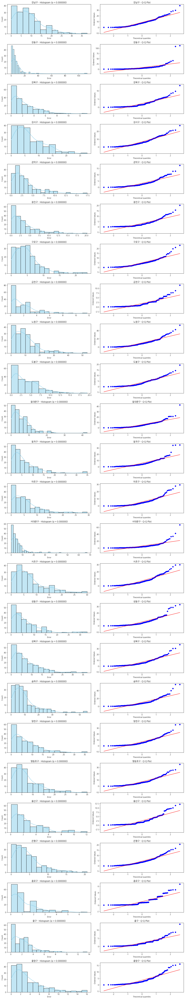

,region,shapiro_p_value,shapiro_5pct_result,anderson_statistic,anderson_5pct_critical,anderson_5pct_result,skewness,kurtosis
0,강남구,0.0,정규성 기각,3.186189,0.771,정규성 기각,1.152064,1.739301
1,강동구,0.0,정규성 기각,24.703367,0.771,정규성 기각,6.003154,43.832366
2,강북구,0.0,정규성 기각,7.591999,0.771,정규성 기각,1.648715,3.827023
3,강서구,0.0,정규성 기각,4.499235,0.771,정규성 기각,1.119158,1.137296
4,관악구,0.0,정규성 기각,8.740756,0.771,정규성 기각,1.779996,3.929068
5,광진구,0.0,정규성 기각,10.065209,0.771,정규성 기각,1.885665,4.352930
6,구로구,0.0,정규성 기각,5.043107,0.771,정규성 기각,1.758896,4.545145
7,금천구,0.0,정규성 기각,10.153282,0.771,정규성 기각,1.910186,4.751682
8,노원구,0.0,정규성 기각,6.192125,0.771,정규성 기각,1.714887,3.966043
9,도봉구,0.0,정규성 기각,5.175070,0.771,정규성 기각,1.285075,2.221959


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# ✅ DataFrame: result_details_df
regions = result_details_df['region'].unique()
n_regions = len(regions)

# 👉 region당 2개 subplot 필요 (히스토그램 + Q-Q)
n_plots = n_regions * 2
n_cols = 2
n_rows = (n_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
axes = axes.flatten()

# ✅ 결과 저장할 리스트 준비
normality_results = []

for i, region in enumerate(regions):
    region_errors = result_details_df[result_details_df['region'] == region]['error']

    # ✅ Shapiro-Wilk 정규성 검정
    if len(region_errors) >= 3:
        shapiro_stat, shapiro_p = stats.shapiro(region_errors)
    else:
        shapiro_p = None

    # ✅ Anderson-Darling 정규성 검정
    if len(region_errors) >= 3:
        anderson_result = stats.anderson(region_errors, dist='norm')
        anderson_stat = round(anderson_result.statistic, 6)

        # Anderson-Darling 결과에서 5% 유의수준 임계값 찾기
        try:
            idx_5 = list(anderson_result.significance_level).index(5.0)
            anderson_5pct_critical = anderson_result.critical_values[idx_5]
        except ValueError:
            anderson_5pct_critical = None
    else:
        anderson_stat = None
        anderson_5pct_critical = None

    # ✅ skewness (왜도) 계산
    if len(region_errors) >= 3:
        skewness = round(stats.skew(region_errors), 6)
    else:
        skewness = None

    # ✅ kurtosis (첨도) 계산 (Fisher's definition: 0 for normal distribution)
    if len(region_errors) >= 3:
        kurtosis = round(stats.kurtosis(region_errors, fisher=True), 6)
    else:
        kurtosis = None

    # ✅ 유의수준 5% 기준 정규성 판정
    if shapiro_p is not None:
        shapiro_normality = "정규성 유지" if shapiro_p > 0.05 else "정규성 기각"
    else:
        shapiro_normality = None

    if (anderson_stat is not None) and (anderson_5pct_critical is not None):
        anderson_normality = "정규성 유지" if anderson_stat < anderson_5pct_critical else "정규성 기각"
    else:
        anderson_normality = None

    # ✅ 결과 리스트에 저장
    normality_results.append({
        'region': region,
        'shapiro_p_value': round(shapiro_p, 6) if shapiro_p is not None else None,
        'shapiro_5pct_result': shapiro_normality,
        'anderson_statistic': anderson_stat,
        'anderson_5pct_critical': round(anderson_5pct_critical, 6) if anderson_5pct_critical is not None else None,
        'anderson_5pct_result': anderson_normality,
        'skewness': skewness,
        'kurtosis': kurtosis
    })

    # 히스토그램
    hist_ax = axes[i * 2]
    sns.histplot(region_errors, kde=True, ax=hist_ax, color='skyblue', edgecolor='black')
    if shapiro_p is not None:
        hist_ax.set_title(f"{region} - Histogram (p = {shapiro_p:.6f})")
    else:
        hist_ax.set_title(f"{region} - Histogram (p = N/A)")
    hist_ax.set_xlabel("Error")

    # Q-Q Plot
    qq_ax = axes[i * 2 + 1]
    stats.probplot(region_errors, dist="norm", plot=qq_ax)
    qq_ax.set_title(f"{region} - Q-Q Plot")

plt.tight_layout()
plt.show()

# ✅ 최종 결과 DataFrame 생성 및 출력
normality_df = pd.DataFrame(normality_results).sort_values('shapiro_p_value')
display(normality_df)

## 7.2) 행정구 별 예측 값 통계 값 파악

In [ ]:
results = []

for region_name in region2idx.keys():
    region_id = region2idx[region_name]
    # result_df, meta = predict_and_detect_one_region(
    #     model=model,
    #     dataloader=test_loader,
    #     device=device,
    #     region_id=region_id,
    #     region_id_to_name={v: k for k, v in region2idx.items()},
    #     region_scaler_dict=scaler,
    #     threshold_k=2.0
    # )

    result_df = result_details_df[result_details_df['region'] == region_name]

    if result_df is not None:
        results.append({
            'region': region_name,
            'pred_mean': result_df['pred'].mean(),
            'pred_var': result_df['pred'].var(),
            'pred_std': result_df['pred'].std(),

            'actual_mean': result_df['actual'].mean(),
            'actual_var': result_df['actual'].var(),
            'actual_std': result_df['actual'].std(),

            'error_mean': result_df['error'].mean(),
            'error_var': result_df['error'].var(),
            'error_std': result_df['error'].std()
        })

# 결과 DataFrame 생성 및 정렬
df_region_preds = pd.DataFrame(results)
df_region_preds = df_region_preds.sort_values('error_mean', ascending=False).round(2)

# 출력
display(df_region_preds)

,region,pred_mean,pred_var,pred_std,actual_mean,actual_var,actual_std,error_mean,error_var,error_std
8,노원구,1.97,0.11,0.34,12.72,87.91,9.38,10.90,82.47,9.08
17,송파구,2.39,0.18,0.42,11.72,92.14,9.60,9.59,86.41,9.30
0,강남구,3.26,0.31,0.56,10.54,49.67,7.05,7.75,41.14,6.41
1,강동구,2.66,0.24,0.49,9.15,165.68,12.87,6.86,159.64,12.63
19,영등포구,1.98,0.14,0.38,8.58,40.45,6.36,6.84,36.41,6.03
18,양천구,1.47,0.08,0.28,7.92,42.32,6.51,6.63,39.45,6.28
16,성북구,2.15,0.17,0.41,8.29,43.34,6.58,6.41,38.54,6.21
14,서초구,2.10,0.18,0.42,8.30,36.40,6.03,6.39,32.87,5.73
15,성동구,2.18,0.14,0.38,7.34,40.14,6.34,5.55,35.54,5.96
12,마포구,1.61,0.08,0.29,6.97,32.51,5.70,5.52,30.08,5.48


In [ ]:
import pandas as pd

def detect_anomalies_mean_std(df: pd.DataFrame, error_col='error', region_col='region', k=2.0):
    """
    각 region별로 mean + k * std 기준 이상탐지 후 is_anomaly 컬럼 생성

    Args:
        df (pd.DataFrame): 예측 결과 테이블
        error_col (str): 오차 컬럼명
        region_col (str): 지역 컬럼명
        k (float): 기준값 배수 (기본: 2.0)

    Returns:
        pd.DataFrame: is_anomaly 컬럼이 추가된 DataFrame
    """
    df = df.copy()

    # 각 지역별 임계값 계산
    thresholds = df.groupby(region_col)[error_col].agg(['mean', 'std'])
    thresholds['threshold'] = thresholds['mean'] + k * thresholds['std']

    # 병합하여 기준값 추가
    df = df.merge(thresholds[['threshold']], left_on=region_col, right_index=True)

    # 이상치 여부 판별
    df['is_anomaly'] = (df[error_col] > df['threshold'])

    # threshold 컬럼 제거하고 결과 반환
    df = df.drop(columns=['threshold'])
    return df

result_details_df = detect_anomalies_mean_std(result_details_df)
result_details_df

,region,forecast_date,pred,actual,error,is_anomaly
0,강남구,2024-07-01,3.035933,19.000000,15.964067,False
1,강남구,2024-07-02,4.000179,15.000001,10.999821,False
2,강남구,2024-07-03,3.544295,16.000000,12.455705,False
3,강남구,2024-07-04,2.785774,16.000000,13.214227,False
4,강남구,2024-07-05,3.357070,22.000000,18.642930,False
...,...,...,...,...,...,...
4595,중랑구,2024-12-27,0.869443,2.000000,1.130557,False
4596,중랑구,2024-12-28,0.899735,10.000000,9.100265,False
4597,중랑구,2024-12-29,0.983637,1.000000,0.016363,False
4598,중랑구,2024-12-30,0.728688,4.000000,3.271312,False


## 7.3) 이상탐지 결과 시각화

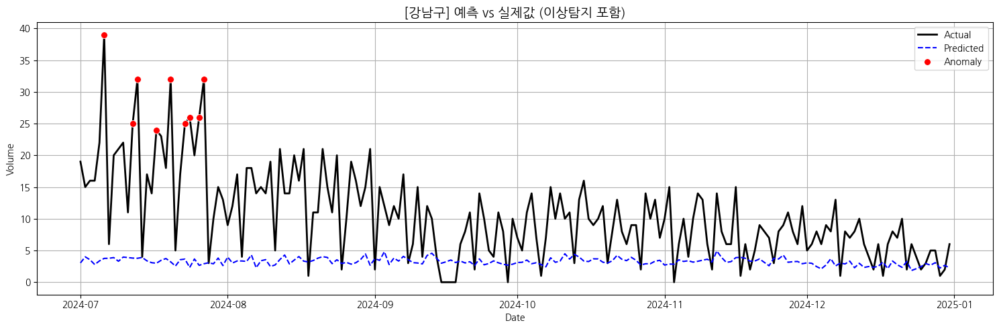

In [ ]:
def plot_region_prediction_with_anomaly(df: pd.DataFrame, region_name: str, anomaly_type: str = "original", figsize=(15, 5)):
    """
    seaborn 기반 예측 vs 실제 + 이상탐지 시각화 (DataFrame 기반)

    Args:
        df (pd.DataFrame): predict_and_detect_one_region 반환 결과
        region_name (str): 지역 이름
        figsize (tuple): 그래프 크기
    """
    df = df.query("region == @region_name")

    df['forecast_date'] = pd.to_datetime(df['forecast_date'])

    # ✅ anomaly 컬럼 선택
    if anomaly_type == "original":
        anomaly_flag = "is_anomaly"
    elif anomaly_type == "otsu":
        anomaly_flag = "is_anomaly_otsu"
    elif anomaly_type == "adaptive_window":
        anomaly_flag = "is_adaptive_anomaly"
    elif anomaly_type == "adaptive_hybrid_window":
        anomaly_flag = "is_final_anomaly"
    elif anomaly_type == "adaptive_iqr_window":
        anomaly_flag = "is_iqr_adaptive_anomaly"
    else:
        raise ValueError("anomaly_type은 'original' 또는 'otsu'만 가능합니다.")

    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x="forecast_date", y="actual", label="Actual", linewidth=2, color="black")
    sns.lineplot(data=df, x="forecast_date", y="pred", label="Predicted", linestyle="--", color="blue")

    # ✅ 선택한 anomaly 컬럼 기반 scatter
    if anomaly_flag in df.columns:
        sns.scatterplot(
            data=df[df[anomaly_flag]],
            x="forecast_date", y="actual",
            color="red", s=50, label="Anomaly", zorder=5
        )
    else:
        print(f"'{anomaly_flag}' 컬럼이 존재하지 않습니다. 이상탐지 표시 없이 그래프를 그립니다.")

    plt.title(f"[{region_name}] 예측 vs 실제값 (이상탐지 포함)", fontsize=14)
    plt.xlabel("Date")
    plt.ylabel("Volume")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

region_name = "강남구"
region_id = region2idx[region_name]
region_id_to_name = {v: k for k, v in region2idx.items()}

if result_df is not None:
    plot_region_prediction_with_anomaly(result_details_df, region_name)
else:
    print(f"[{region_name}] 예측 결과가 없습니다.")

## 7.4) 행정구 별 이상치 비율

In [ ]:
def analyze_all_regions(
    # model,
    # dataloader,
    # device,
    output,
    region2idx,
    region_scaler_dict,
    threshold_k=2.0,
    anomaly_type: str = "original"
):
    results = []

    region_id_to_name = {v: k for k, v in region2idx.items()}

    # ✅ 사용할 이상치 플래그 선택
    if anomaly_type == "original":
        anomaly_col = "is_anomaly"
    elif anomaly_type == "otsu":
        anomaly_col = "is_anomaly_otsu"
    elif anomaly_type == "adaptive_window":
        anomaly_col = "is_adaptive_anomaly"
    elif anomaly_type == "adaptive_hybrid_window":
        anomaly_col = "is_final_anomaly"
    elif anomaly_type == "adaptive_iqr_window":
        anomaly_col = "is_iqr_adaptive_anomaly"
    else:
        raise ValueError("anomaly_type은 'original' 또는 'otsu'만 가능합니다.")

    for region_name, region_id in region2idx.items():
        # output = predict_and_detect_one_region(
        #     model=model,
        #     dataloader=dataloader,
        #     device=device,
        #     region_id=region_id,
        #     region_id_to_name=region_id_to_name,
        #     region_scaler_dict=region_scaler_dict,
        #     threshold_k=threshold_k
        # )

        df_result = output[output['region'] == region_name]

        # if output is None:
        #     continue

        # df_result, meta = output  # ✅ 언패킹

        results.append({
            "region": region_name,
            # "threshold": meta["threshold"],
            # "mean_error": meta["mean_error"],
            # "std_error": meta["std_error"],
            "anomaly_ratio": df_result[anomaly_col].mean(),
            "sample_count": len(df_result)
        })

    stats_df = pd.DataFrame(results).sort_values("anomaly_ratio", ascending=False)

    # 시각화
    plt.figure(figsize=(15, 5))
    sns.barplot(data=stats_df, x="region", y="anomaly_ratio", palette='coolwarm')
    for idx, value in enumerate(stats_df["anomaly_ratio"]):
        plt.text(idx, value, f"{value:.3%}", ha="center", va="bottom", fontsize=9)

    plt.xlabel("지역")
    plt.ylabel("이상치 비율")
    plt.title("지역별 이상치 비율")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return stats_df


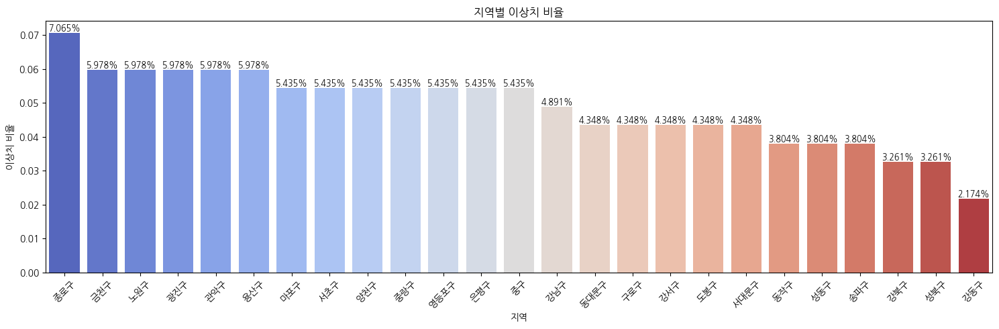

,region,anomaly_ratio,sample_count
22,종로구,0.070652,184
7,금천구,0.059783,184
8,노원구,0.059783,184
5,광진구,0.059783,184
4,관악구,0.059783,184
20,용산구,0.059783,184
12,마포구,0.054348,184
14,서초구,0.054348,184
18,양천구,0.054348,184
24,중랑구,0.054348,184


In [ ]:
stats_df = analyze_all_regions(
    # model=model,
    # dataloader=test_loader,
    # device=device,
    output=result_details_df,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    threshold_k=2.0
)

stats_df

## 7.5) 행정구 별 이상치 Threshold

In [ ]:
# 시각화
result_origin_thresholds_df = result_details_df[['region', 'threshold']].drop_duplicates()

plt.figure(figsize=(15, 5))
sns.barplot(data=result_origin_thresholds_df.sort_values('threshold', ascending=False), x="region", y="threshold", palette='coolwarm')
for idx, value in enumerate(result_origin_thresholds_df.sort_values('threshold', ascending=False)["threshold"]):
    plt.text(idx, value, f"{np.round(value, 2)}", ha="center", va="bottom", fontsize=9)

plt.xlabel("지역")
plt.ylabel("Threshold")
plt.title("지역 별 이상치 Threshold 값")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

KeyError: "['threshold'] not in index"

## 7.6) Index 결과 비교 분석

In [ ]:
origin_test_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/real_test2/apt_sales_volume_daily_register_202111_202412_test_vdd_modified.csv')
origin_test_df['date'] = pd.to_datetime(origin_test_df['date'])
result_details_df['forecast_date'] = pd.to_datetime(result_details_df['forecast_date'])

final_result_df = origin_test_df.merge(result_details_df, left_on=['region', 'date'], right_on=['region', 'forecast_date'])

In [ ]:
final_result_df.groupby('is_anomaly').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    direct_trade_index=('direct_trade_ratio', 'mean'),
    vdd_index=('vdd_index', 'mean'),
    abs_vdd_index=('abs_vdd_index', 'mean'),
    anomaly_score=('anomaly_score', 'mean')
)

,volume_cnt,cancel_cnt,pod_index,canceld_index,direct_trade_index,vdd_index,abs_vdd_index,anomaly_score
is_anomaly,,,,,,,,
False,24413,971,0.337814,0.032498,0.042121,-0.129191,0.497207,0.109050
True,4797,232,0.342204,0.053022,0.046250,1.414366,1.414366,0.151904


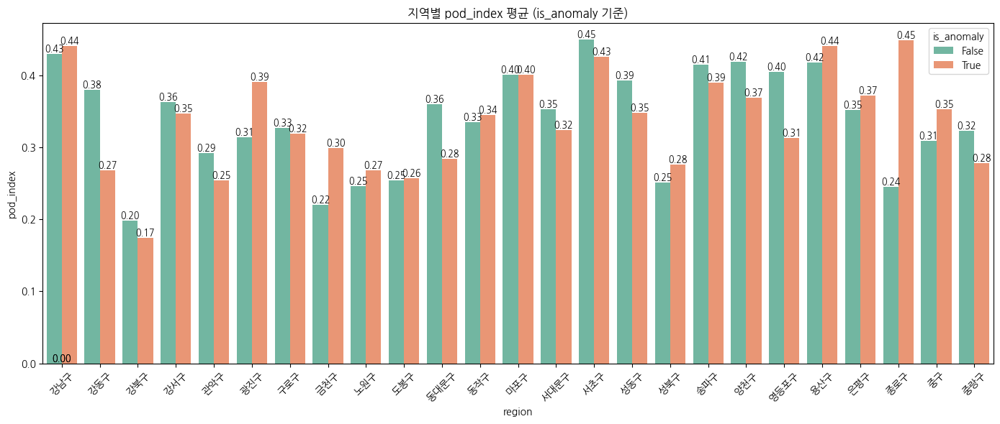

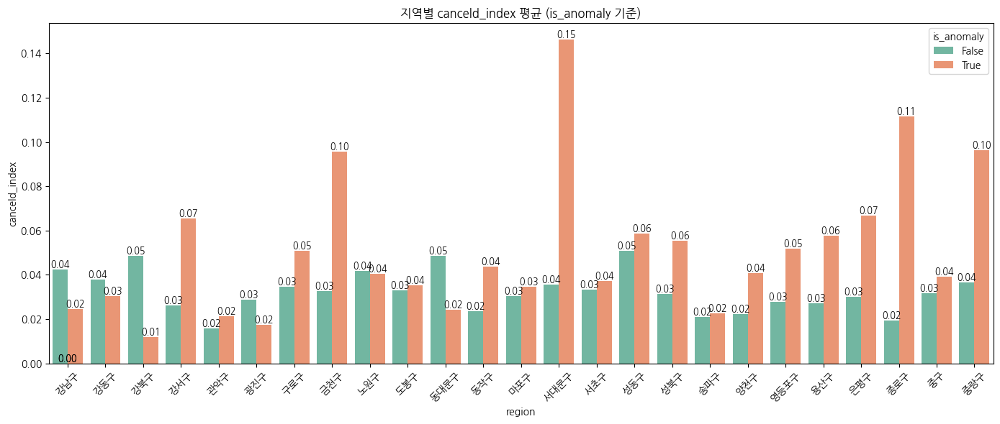

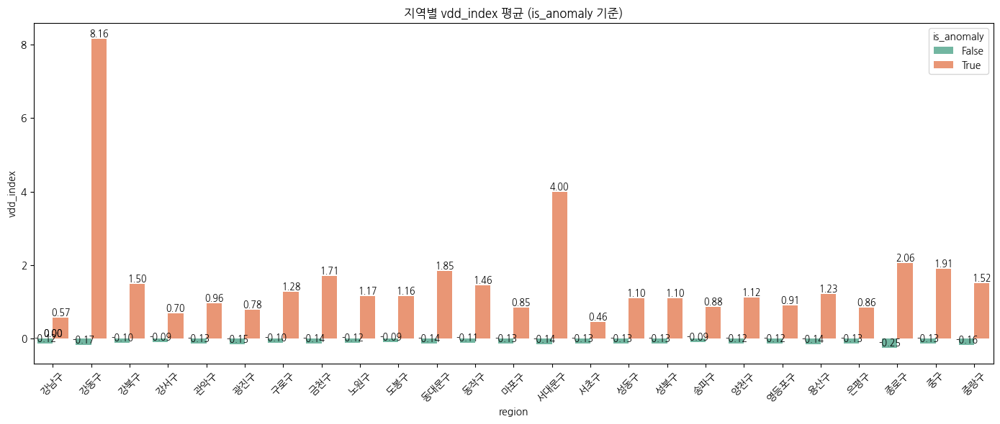

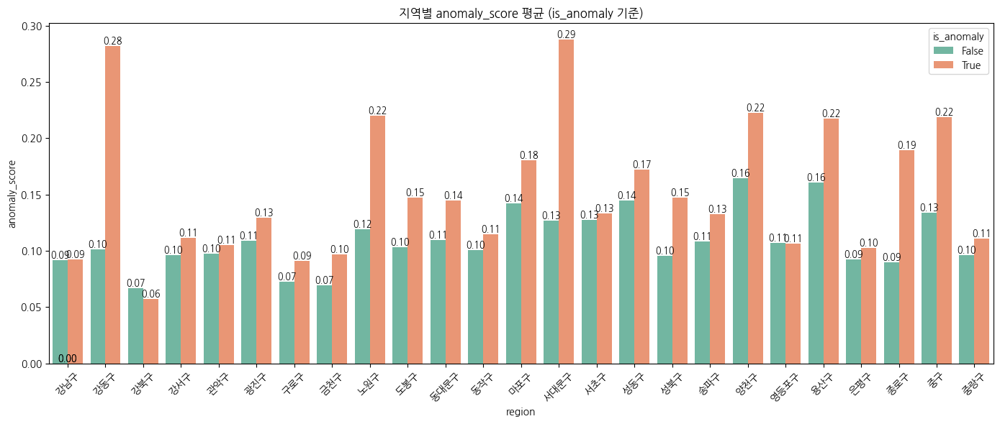

In [ ]:
final_result_df.groupby(['region', 'is_anomaly'])[['pod_index', 'canceld_index', 'vdd_index']].mean()

cols = ['pod_index', 'canceld_index', 'vdd_index', 'anomaly_score']

# region + is_anomaly 그룹별 평균 계산
grouped_means = final_result_df.groupby(['region', 'is_anomaly'])[cols].mean().reset_index()

for col in cols:
    plt.figure(figsize=(14, 6))
    ax = sns.barplot(data=grouped_means, x='region', y=col, hue='is_anomaly', palette='Set2')

    # 막대 위에 텍스트 표시
    for p in ax.patches:
        height = p.get_height()
        if not np.isnan(height):
            ax.text(
                x=p.get_x() + p.get_width() / 2,
                y=height,
                s=f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

    plt.title(f'지역별 {col} 평균 (is_anomaly 기준)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [ ]:
# 최종 결과
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

print(anomaly_score_label_col)

# 실제 값 (정답 라벨)
y_true = final_result_df[anomaly_score_label_col].astype(int)

# 예측값 (bool → int로 변환)
y_pred = final_result_df['is_anomaly'].astype(int)

# 평가 지표 계산
precision = precision_score(y_true, y_pred)
recall    = recall_score(y_true, y_pred)
f1        = f1_score(y_true, y_pred)
accuracy  = accuracy_score(y_true, y_pred)

print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")
print(f"Accuracy  : {accuracy:.4f}")


is_anomaly_score_outlier_25.0%
Precision : 0.4688
Recall    : 0.0833
F1-score  : 0.1414
Accuracy  : 0.7228


In [ ]:
def find_best_k_for_mean_std_anomaly(
    df: pd.DataFrame,
    label_col: str,
    apt_volume_test_df_origin: pd.DataFrame,
    error_col: str = 'error',
    region_col: str = 'region',
    k_values=np.arange(1.0, 3.05, 0.2)
):
    best_k = None
    best_f1 = -1
    best_metrics = {}

    for k in k_values:

        # 이상탐지 수행
        result_df = detect_anomalies_mean_std(df, error_col=error_col, region_col=region_col, k=k)

        # forecast_date를 datetime 형식으로 변환
        result_df['forecast_date'] = pd.to_datetime(result_df['forecast_date'])

        # 정답 데이터와 병합
        merged = apt_volume_test_df_origin.merge(
            result_df,
            left_on=['region', 'date'],
            right_on=['region', 'forecast_date']
        )

        # 정답 및 예측값 추출
        y_true = merged[label_col].astype(int)
        y_pred = merged['is_anomaly'].astype(int)

        f1 = f1_score(y_true, y_pred, zero_division=0)
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall = recall_score(y_true, y_pred, zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        print(f"[k={k:.2f}→ F1 = {f1:.4f}, Precision = {precision:.4f}, Recall = {recall:.4f}, Accuracy = {accuracy:.4f}")

        if f1 > best_f1:
            best_f1 = f1
            best_k = k

            best_precision = precision
            best_recall = recall
            best_accuracy = accuracy

            print(f"\n✅ Best k = {best_k}")
            print(f"   ↳ F1-score  = {best_f1:.4f}")
            print(f"   ↳ Precision = {best_precision:.4f}")
            print(f"   ↳ Recall    = {best_recall:.4f}")
            print(f"   ↳ Accuracy  = {best_accuracy:.4f}")

            best_metrics = {
                'k': k,
                'f1_score': f1,
                'precision': precision,
                'recall': recall,
                'accuracy': accuracy
            }

    return best_metrics


In [ ]:
best_k_result = find_best_k_for_mean_std_anomaly(
    df=result_details_df,
    label_col=anomaly_score_label_col,
    apt_volume_test_df_origin=origin_test_df
)


[k=1.00→ F1 = 0.2489, Precision = 0.3882, Recall = 0.1832, Accuracy = 0.6970

✅ Best k = 1.0
   ↳ F1-score  = 0.2489
   ↳ Precision = 0.3882
   ↳ Recall    = 0.1832
   ↳ Accuracy  = 0.6970
[k=1.20→ F1 = 0.2304, Precision = 0.4052, Recall = 0.1610, Accuracy = 0.7052
[k=1.40→ F1 = 0.1965, Precision = 0.4175, Recall = 0.1285, Accuracy = 0.7120
[k=1.60→ F1 = 0.1722, Precision = 0.4263, Recall = 0.1079, Accuracy = 0.7157
[k=1.80→ F1 = 0.1582, Precision = 0.4498, Recall = 0.0960, Accuracy = 0.7200
[k=2.00→ F1 = 0.1414, Precision = 0.4688, Recall = 0.0833, Accuracy = 0.7228
[k=2.20→ F1 = 0.1282, Precision = 0.4895, Recall = 0.0738, Accuracy = 0.7250
[k=2.40→ F1 = 0.1059, Precision = 0.4808, Recall = 0.0595, Accuracy = 0.7246
[k=2.60→ F1 = 0.0918, Precision = 0.4776, Recall = 0.0508, Accuracy = 0.7246
[k=2.80→ F1 = 0.0774, Precision = 0.4862, Recall = 0.0420, Accuracy = 0.7252
[k=3.00→ F1 = 0.0635, Precision = 0.4574, Recall = 0.0341, Accuracy = 0.7241


## 7.7) 동적 임계 값 설정

### 7.7.1) Otsu Method

In [ ]:
import pandas as pd
import numpy as np
from skimage.filters import threshold_otsu

# ✅ DataFrame: result_details_df
# columns: ['region', 'forecast_date', 'pred', 'actual', 'error']

# 결과 저장용 리스트
otsu_results = []

# ✅ 지역별로 loop
for region, group in result_details_df.groupby('region'):
    errors = group['error'].values

    if len(errors) < 2:
        # 데이터가 너무 적으면 threshold 계산 불가
        otsu_threshold = None
        is_anomaly = [False] * len(errors)
    else:
        # ✅ Otsu Method로 threshold 계산
        otsu_threshold = threshold_otsu(errors)

        # ✅ 이상치 탐지 (error > otsu_threshold이면 이상치로 간주)
        is_anomaly = errors > otsu_threshold

    # 결과 저장
    region_result = group.copy()
    region_result['otsu_threshold'] = otsu_threshold
    region_result['is_anomaly_otsu'] = is_anomaly

    otsu_results.append(region_result)

# ✅ 모든 지역 결과 합치기
final_otsu_result_df = pd.concat(otsu_results, axis=0).reset_index(drop=True)

# ✅ 결과 확인
display(final_otsu_result_df)


In [ ]:
region_name = "도봉구"

# ✅ result_df, meta = predict_and_detect_one_region(...) 호출해서 result_details_df 생성했다고 가정

# 🔵 기본 original 이상치 결과 보기
plot_region_prediction_with_anomaly(final_otsu_result_df, region_name, anomaly_type="original")

# 🔴 Otsu 기반 이상치 결과 보기
plot_region_prediction_with_anomaly(final_otsu_result_df, region_name, anomaly_type="otsu")

In [ ]:
# 🔴 Otsu 기반 이상치 비율 분석
stats_otsu = analyze_all_regions(
    output=final_otsu_result_df,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    anomaly_type="otsu"
)

# stats_otsu

In [ ]:
otsu_threshold_result = final_otsu_result_df[['region', 'otsu_threshold']].drop_duplicates()


# 시각화
plt.figure(figsize=(15, 5))
sns.barplot(data=otsu_threshold_result.sort_values('otsu_threshold', ascending=False), x="region", y="otsu_threshold", palette='coolwarm')
for idx, value in enumerate(otsu_threshold_result.sort_values('otsu_threshold', ascending=False)["otsu_threshold"]):
    plt.text(idx, value, f"{np.round(value, 2)}", ha="center", va="bottom", fontsize=9)

plt.xlabel("지역")
plt.ylabel("Threshold")
plt.title("지역 별 이상치 Threshold 값")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
final_otsu_result_df['forecast_date'] = pd.to_datetime(final_otsu_result_df['forecast_date'])

final_otsu_result_df_temp = origin_test_df.merge(final_otsu_result_df, left_on=['region', 'date'], right_on=['region', 'forecast_date'])

final_otsu_result_df_temp.groupby('is_anomaly_otsu').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    vdd_index=('vdd_index', 'mean')
)

In [ ]:
final_otsu_result_df_temp.groupby(['region', 'is_anomaly_otsu'])[['pod_index', 'canceld_index', 'vdd_index']].mean()

cols = ['pod_index', 'canceld_index', 'vdd_index']

# region + is_anomaly 그룹별 평균 계산
grouped_means = final_otsu_result_df_temp.groupby(['region', 'is_anomaly_otsu'])[cols].mean().reset_index()

for col in cols:
    plt.figure(figsize=(14, 6))
    ax = sns.barplot(data=grouped_means, x='region', y=col, hue='is_anomaly_otsu', palette='Set2')

    # 막대 위에 텍스트 표시
    for p in ax.patches:
        height = p.get_height()
        if not np.isnan(height):
            ax.text(
                x=p.get_x() + p.get_width() / 2,
                y=height,
                s=f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

    plt.title(f'지역별 {col} 평균 (is_anomaly 기준)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### 7.7.2) Window Sliding
* Adaptive Threshold with Sliding Window

In [28]:
from scipy import stats

def adaptive_threshold_detection_with_valid(
    valid_df: pd.DataFrame,
    test_df: pd.DataFrame,
    region_col: str = 'region',
    error_col: str = 'error',
    date_col: str = 'forecast_date',
    baseline_days: int = 30,
    new_window_size: int = 30,
    threshold_k: float = 2,
    ztest_alpha: float = 0.05
) -> pd.DataFrame:
    """
    valid set의 마지막 기간을 baseline으로 사용하고,
    test set에 대해 adaptive threshold 이상탐지 수행

    Returns:
        pd.DataFrame: test_df에 is_adaptive_anomaly, dynamic_threshold, adaptive_threshold 컬럼 추가
    """
    results = []

    for region in test_df[region_col].unique():
        test_region = test_df[test_df[region_col] == region].sort_values(date_col).reset_index(drop=True)
        valid_region = valid_df[valid_df[region_col] == region].sort_values(date_col)

        # ✅ baseline 구간: valid set 마지막 baseline_days 일
        baseline_region = valid_region.tail(baseline_days)
        if len(baseline_region) < baseline_days:
            print(f"[경고] {region}: baseline 구간 데이터 부족")
            continue

        baseline_errors = baseline_region[error_col].values
        mu_baseline = np.mean(baseline_errors)
        sigma_baseline = np.std(baseline_errors)
        threshold = mu_baseline + threshold_k * sigma_baseline

        errors = test_region[error_col].values
        n = len(errors)

        anomalies = []
        thresholds = []

        # ✅ 슬라이딩 윈도우
        for i in range(0, n, new_window_size):
            new_window = errors[i:i+new_window_size]

            if len(new_window) < 5:
                anomalies.extend([False] * len(new_window))
                thresholds.extend([threshold] * len(new_window))
                continue

            mu_new = np.mean(new_window)
            sigma_new = np.std(new_window)

            # z-test
            z_score = np.abs(mu_new - mu_baseline) / np.sqrt((sigma_new**2/len(new_window)) + (sigma_baseline**2/baseline_days))
            p_value = 2 * (1 - stats.norm.cdf(z_score))

            if p_value < ztest_alpha:
                # baseline 업데이트
                baseline_errors = new_window
                mu_baseline = mu_new
                sigma_baseline = sigma_new
                threshold = mu_baseline + threshold_k * sigma_baseline

            window_anomalies = new_window > threshold
            anomalies.extend(window_anomalies)
            thresholds.extend([threshold] * len(new_window))

        anomalies = anomalies[:n]
        thresholds = thresholds[:n]

        test_region['dynamic_threshold'] = thresholds
        test_region['adaptive_threshold'] = np.mean(thresholds)
        test_region['is_adaptive_anomaly'] = anomalies

        results.append(test_region)

    return pd.concat(results, ignore_index=True)


In [ ]:
# ✅ result_details_df: region, forecast_date, pred, actual, error 컬럼을 가진 DataFrame

adaptive_result_df = adaptive_threshold_detection_with_valid(
    valid_df=valid_result_df,
    test_df=test_result_df,
    baseline_days=30
)

adaptive_result_df

,region,forecast_date,pred,actual,error,dynamic_threshold,adaptive_threshold,is_adaptive_anomaly
0,강남구,2024-07-01,3.683458,19.000000,15.316542,33.139480,17.985010,False
1,강남구,2024-07-02,3.018409,15.000001,11.981591,33.139480,17.985010,False
2,강남구,2024-07-03,2.643233,16.000000,13.356768,33.139480,17.985010,False
3,강남구,2024-07-04,2.778451,16.000000,13.221549,33.139480,17.985010,False
4,강남구,2024-07-05,2.414147,22.000000,19.585854,33.139480,17.985010,False
...,...,...,...,...,...,...,...,...
4595,중랑구,2024-12-27,0.318658,2.000000,1.681342,6.109018,8.799716,False
4596,중랑구,2024-12-28,0.799914,10.000000,9.200086,6.109018,8.799716,False
4597,중랑구,2024-12-29,0.650584,1.000000,0.349416,6.109018,8.799716,False
4598,중랑구,2024-12-30,0.443469,4.000000,3.556532,6.109018,8.799716,False


In [ ]:
region_name = "종로구"

# ✅ result_df, meta = predict_and_detect_one_region(...) 호출해서 result_details_df 생성했다고 가정

# 🔵 기본 original 이상치 결과 보기
plot_region_prediction_with_anomaly(result_details_df, region_name, anomaly_type="original")

# 🔴 Otsu 기반 이상치 결과 보기
# plot_region_prediction_with_anomaly(adaptive_result_df, region_name, anomaly_type="otsu")

plot_region_prediction_with_anomaly(adaptive_result_df, region_name, anomaly_type="adaptive_window")


NameError: name 'plot_region_prediction_with_anomaly' is not defined

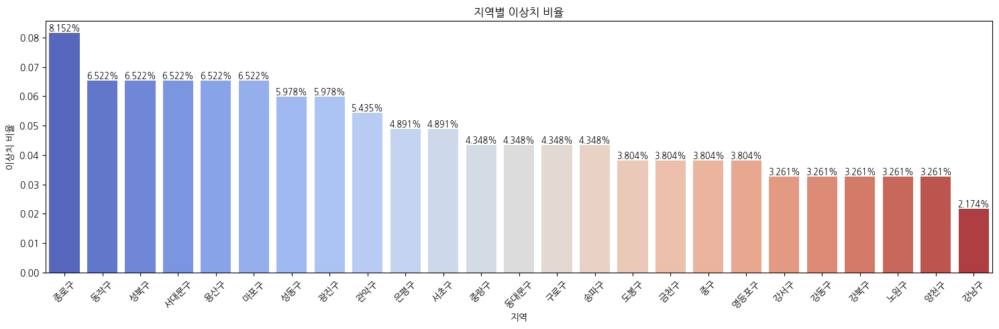

,region,anomaly_ratio,sample_count
22,종로구,0.081522,184
11,동작구,0.065217,184
16,성북구,0.065217,184
13,서대문구,0.065217,184
20,용산구,0.065217,184
12,마포구,0.065217,184
15,성동구,0.059783,184
5,광진구,0.059783,184
4,관악구,0.054348,184
21,은평구,0.048913,184


In [ ]:
# 🔴 adaptive 기반 이상치 비율 분석
analyze_all_regions(
    output=adaptive_result_df,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    anomaly_type="adaptive_window"
)


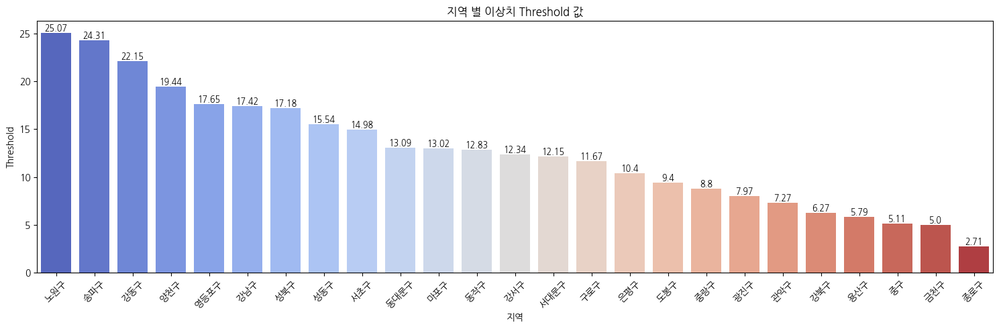

In [ ]:
adaptive_window_threshold_df = adaptive_result_df[['region', 'adaptive_threshold']].drop_duplicates()

# 시각화
plt.figure(figsize=(15, 5))
sns.barplot(data=adaptive_window_threshold_df.sort_values('adaptive_threshold', ascending=False), x="region", y="adaptive_threshold", palette='coolwarm')
for idx, value in enumerate(adaptive_window_threshold_df.sort_values('adaptive_threshold', ascending=False)["adaptive_threshold"]):
    plt.text(idx, value, f"{np.round(value, 2)}", ha="center", va="bottom", fontsize=9)

plt.xlabel("지역")
plt.ylabel("Threshold")
plt.title("지역 별 이상치 Threshold 값")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
apt_volume_test_df_origin = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test2/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_label_combi.csv')
apt_volume_test_df_origin['date'] = pd.to_datetime(apt_volume_test_df_origin['date'])

adaptive_result_df['forecast_date'] = pd.to_datetime(adaptive_result_df['forecast_date'])


adaptive_result_df_temp = adaptive_result_df.merge(apt_volume_test_df_origin, left_on=['region', 'forecast_date'], right_on=['region', 'date'], how='left')

adaptive_result_df_temp.groupby('is_adaptive_anomaly').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    direct_trade_index=('direct_trade_ratio', 'mean'),
    vdd_index=('vdd_index', 'mean'),
    abs_vdd_index=('abs_vdd_index', 'mean'),

    anomaly_score=('anomaly_score', 'mean')
)

,volume_cnt,cancel_cnt,pod_index,canceld_index,direct_trade_index,vdd_index,abs_vdd_index,anomaly_score
is_adaptive_anomaly,,,,,,,,
False,25345,1010,0.337120,0.031773,0.042360,-0.148563,0.477691,0.257442
True,3865,193,0.355863,0.067351,0.041578,1.801526,1.801526,0.688524


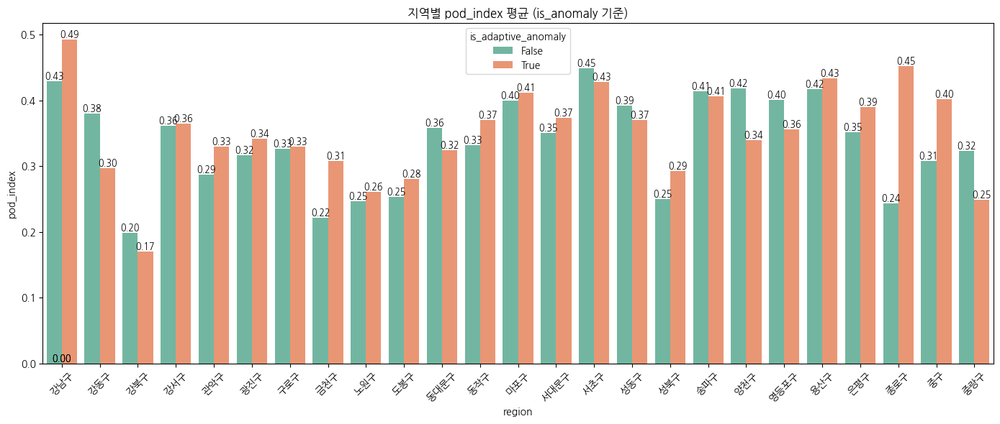

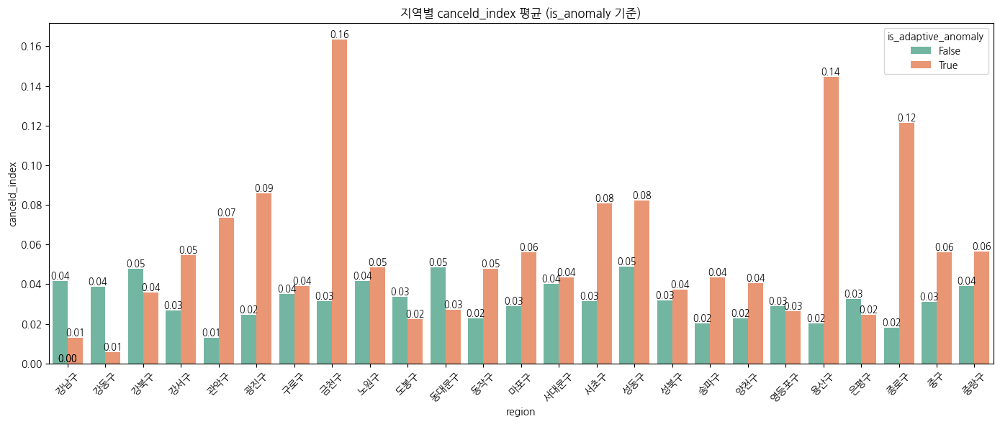

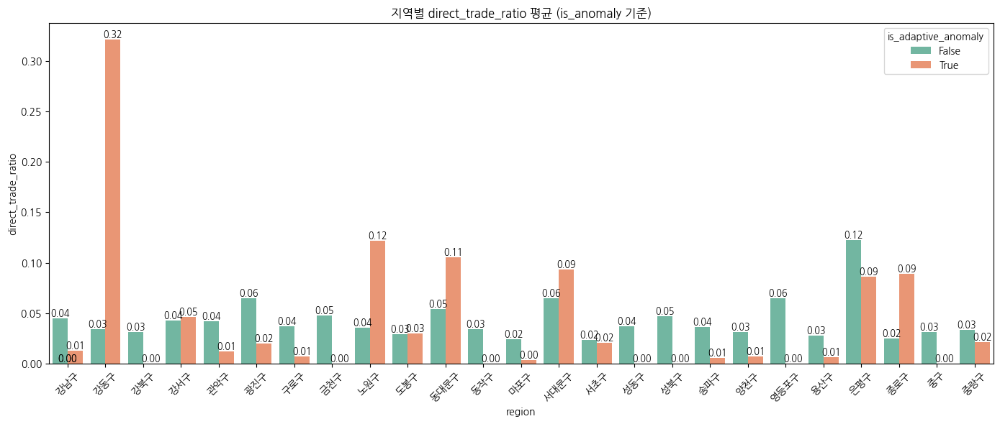

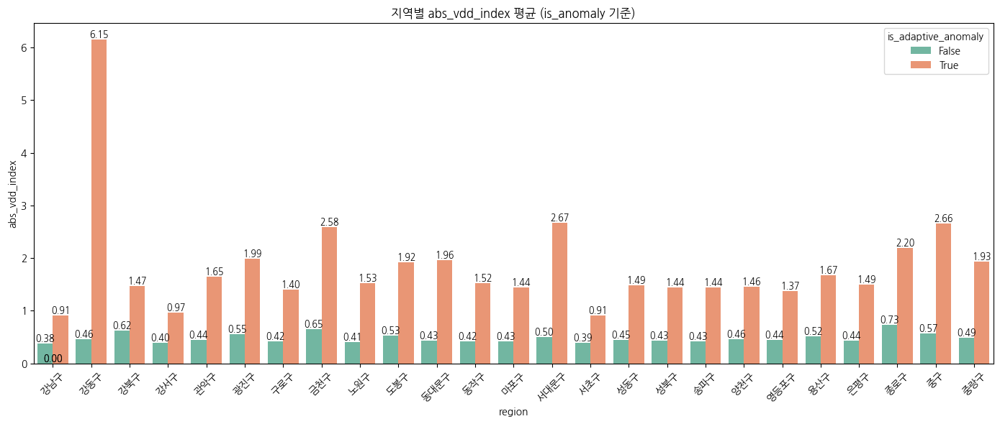

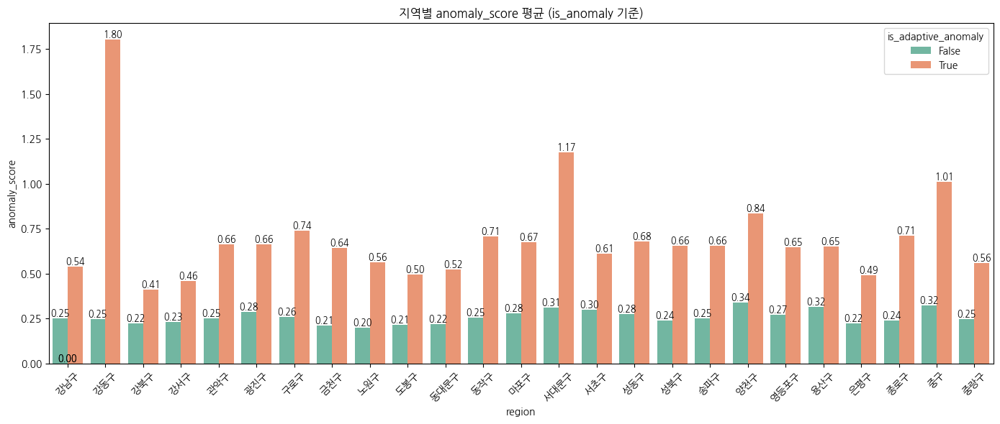

In [ ]:

cols = ['pod_index', 'canceld_index', 'direct_trade_ratio', 'abs_vdd_index', 'anomaly_score']

# region + is_anomaly 그룹별 평균 계산
grouped_means = adaptive_result_df_temp.groupby(['region', 'is_adaptive_anomaly'])[cols].mean().reset_index()

for col in cols:
    plt.figure(figsize=(14, 6))
    ax = sns.barplot(data=grouped_means, x='region', y=col, hue='is_adaptive_anomaly', palette='Set2')

    # 막대 위에 텍스트 표시
    for p in ax.patches:
        height = p.get_height()
        if not np.isnan(height):
            ax.text(
                x=p.get_x() + p.get_width() / 2,
                y=height,
                s=f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

    plt.title(f'지역별 {col} 평균 (is_anomaly 기준)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [31]:
# 최종 결과
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 실제 값 (정답 라벨)
print(anomaly_score_label_col)
y_true = adaptive_result_df_temp[anomaly_score_label_col].astype(int)

# 예측값 (bool → int로 변환)
y_pred = adaptive_result_df_temp['is_adaptive_anomaly'].astype(int)

# 평가 지표 계산
precision = precision_score(y_true, y_pred)
recall    = recall_score(y_true, y_pred)
f1        = f1_score(y_true, y_pred)
accuracy  = accuracy_score(y_true, y_pred)

print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")
print(f"Accuracy  : {accuracy:.4f}")


is_anomaly_score_outlier_mean_2sigma_win30
Precision : 0.6205
Recall    : 0.6233
F1-score  : 0.6219
Accuracy  : 0.9633


In [32]:
from sklearn.metrics import precision_score, recall_score, f1_score
import torch

MAX_TRIALS = 100  # 최대 시도 횟수
TARGET_F1 = 0.62
trial = 0
best_f1 = -1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

rmse_fn = RMSELoss()
mae_fn = MAELoss()

best_model_state_dict = None
best_train_result_df = None
best_valid_result_df = None
best_test_result_df = None

apt_volume_test_df_origin = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_label_combi3.csv')

while trial < MAX_TRIALS:
    trial += 1
    print(f"\n🚀 [Trial {trial}] Start Training...")

    # 모델 초기화 (반복마다 새로)
    model = Autoformer(
        seq_len=30,             # 인코더 입력 길이
        label_len=10,           # 디코더 과거 입력 길이
        pred_len=1,             # 예측할 미래 길이
        enc_in=53,              # x_enc feature 수
        dec_in=53,              # x_dec feature 수 (보통 enc_in과 동일)
        c_out=1,                # 예측값 차원
        d_model=64,             # 모델 차원
        d_ff=256,               # 피드포워드 차원 (선택, 기본은 4*d_model)
        n_heads=4,              # Multi-head 개수
        e_layers=2,             # 인코더 레이어 수
        d_layers=2,             # 디코더 레이어 수
        dropout=0.1,            # 드롭아웃 비율
        activation="gelu",      # 활성화 함수
        embed="fixed",          # 임베딩 타입
        freq="d",               # 시간 주기 (일 단위)
        factor=1,               # Attention factor
        moving_avg=25,          # Moving average window
        output_attention=False, # Attention 출력 여부
        region_vocab_size=25,   # 지역 개수
        region_emb_dim=64       # 지역 임베딩 차원
    ).to(device)

    criterion = nn.MSELoss()
    lr_rate = 1e-4
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr_rate)

    # ✅ 훈련
    for epoch in range(50):
        train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device, mae_fn, rmse_fn)
        val_metrics = evaluate(model, val_loader, criterion, device, mae_fn, rmse_fn)

        print(f"[Epoch {epoch+1}]")
        print(f"Train Loss: {train_metrics['loss']:.4f}, RMSE: {train_metrics['rmse']:.4f}, MAE: {train_metrics['mae']:.4f}")
        print(f"Val   Loss: {val_metrics['loss']:.4f}, RMSE: {val_metrics['rmse']:.4f}, MAE: {val_metrics['mae']:.4f}")

    # ✅ 예측
    result_df_dict = predict_all_regions_by_split(
        model=model,
        device=device,
        region2idx=region2idx,
        region_scaler_dict=scaler,
        train_loader=train_loader,
        valid_loader=val_loader,
        test_loader=test_loader,
        train_period=("2021-11-01", "2024-01-31"),
        valid_period=("2024-02-01", "2024-05-31"),
        test_period=("2024-06-01", "2024-12-31"),
        input_len=30,
        label_len=10,
        pred_len=1
    )

    train_result_df = result_df_dict["train"]
    valid_result_df = result_df_dict["valid"]
    test_result_df  = result_df_dict["test"]

    # ✅ Adaptive threshold 이상탐지 수행
    adaptive_result_df = adaptive_threshold_detection_with_valid(
        valid_df=result_df_dict["valid"],
        test_df=test_result_df,
        threshold_k=2.0,
        new_window_size=30,
        baseline_days=30
    )

    # ✅ 원본 테스트 데이터 병합
    apt_volume_test_df_origin['date'] = pd.to_datetime(apt_volume_test_df_origin['date'])
    adaptive_result_df['forecast_date'] = pd.to_datetime(adaptive_result_df['forecast_date'])
    adaptive_result_df_temp = apt_volume_test_df_origin.merge(
        adaptive_result_df,
        left_on=['region', 'date'],
        right_on=['region', 'forecast_date']
    )

    # ✅ 평가 지표 계산
    y_true = adaptive_result_df_temp[anomaly_score_label_col].astype(int)
    y_pred = adaptive_result_df_temp['is_adaptive_anomaly'].astype(int)

    precision = precision_score(y_true, y_pred)
    recall    = recall_score(y_true, y_pred)
    f1        = f1_score(y_true, y_pred)

    print(f"[Trial {trial}] Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")

    # ✅ F1 만족 시 종료
    if f1 > TARGET_F1:
        print(f"\n✅ Target F1-score {f1:.4f} achieved at trial {trial}.")
        torch.save(model.state_dict(), f'apt_volume_pred_autoformer_50_202111_202412_{anomaly_score_label_col}_index_exist_{trial}.pth')

        train_result_df.to_csv(f'apt_volume_pred_autoformer_50_pred_result_train_202111_202412_{anomaly_score_label_col}_index_exist_{trial}.csv', index=False)
        valid_result_df.to_csv(f'apt_volume_pred_autoformer_50_pred_result_valid_202111_202412_{anomaly_score_label_col}_index_exist_{trial}.csv', index=False)
        test_result_df.to_csv(f'apt_volume_pred_autoformer_50_pred_result_test_202111_202412_{anomaly_score_label_col}_index_exist_{trial}.csv', index=False)

        break

    # ✅ 최고 F1-score 갱신
    if f1 > best_f1:
        best_f1 = f1
        best_trial = trial  # ✅ 최고 trial 번호 기록
        best_model_state_dict = model.state_dict()
        best_train_result_df = train_result_df.copy()
        best_valid_result_df = valid_result_df.copy()
        best_test_result_df  = test_result_df.copy()

    # ✅ MAX_TRIALS 절반 도달 시 best 모델 저장
    if trial == MAX_TRIALS // 2:
        print(f"\n🟡 Midpoint Reached (Trial {trial}) - Saving Best Model So Far with F1-score {best_f1:.4f} (from Trial {best_trial})")
        torch.save(best_model_state_dict, f'apt_volume_pred_lstm_best_midpoint_{anomaly_score_label_col}_index_exist_{best_trial}.pth')
        best_train_result_df.to_csv(f'apt_volume_pred_lstm_best_midpoint_pred_result_train_{anomaly_score_label_col}_index_exist_{best_trial}.csv', index=False)
        best_valid_result_df.to_csv(f'apt_volume_pred_lstm_best_midpoint_pred_result_valid_{anomaly_score_label_col}_index_exist_{best_trial}.csv', index=False)
        best_test_result_df.to_csv(f'apt_volume_pred_lstm_best_midpoint_pred_result_test_{anomaly_score_label_col}_index_exist_{best_trial}.csv', index=False)

else:
    print("\n❌ F1-score target not met within trial limit.")



🚀 [Trial 1] Start Training...
[Epoch 1]
Train Loss: 0.2055, RMSE: 0.3215, MAE: 0.2465
Val   Loss: 0.2265, RMSE: 0.4670, MAE: 0.3616


KeyboardInterrupt: 

In [33]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
import numpy as np
import pandas as pd

def find_best_threshold_k_and_window(
    valid_df,
    test_df,
    apt_volume_test_df_origin,
    label_col='is_anomaly_score_outlier_5.0%',
    k_list=np.arange(1.0, 3.0, 0.1),
    window_list=np.arange(1, 31, 1)
):
    best_k = None
    best_window = None
    best_f1 = -1
    best_result_df = None

    best_precision = None
    best_recall = None
    best_accuracy = None

    for k in k_list:
        for win in window_list:
            result_df = adaptive_threshold_detection_with_valid(
                valid_df=valid_df,
                test_df=test_df,
                threshold_k=k,
                new_window_size=win
            )

            apt_volume_test_df_origin['date'] = pd.to_datetime(apt_volume_test_df_origin['date'])
            result_df['forecast_date'] = pd.to_datetime(result_df['forecast_date'])
            result_df = apt_volume_test_df_origin.merge(
                result_df,
                left_on=['region', 'date'],
                right_on=['region', 'forecast_date']
            )

            y_true = result_df[label_col].astype(int)
            y_pred = result_df['is_adaptive_anomaly'].astype(int)

            if y_true.sum() == 0 and y_pred.sum() == 0:
                f1 = 0.0
                precision = 0.0
                recall = 0.0
                accuracy = 1.0
            else:
                f1 = f1_score(y_true, y_pred, zero_division=0)
                precision = precision_score(y_true, y_pred, zero_division=0)
                recall = recall_score(y_true, y_pred, zero_division=0)
                accuracy = accuracy_score(y_true, y_pred)

            print(f"[k={k:.2f}, win={win}] → F1 = {f1:.4f}, Precision = {precision:.4f}, Recall = {recall:.4f}, Accuracy = {accuracy:.4f}")

            if f1 > best_f1:
                best_f1 = f1
                best_k = k
                best_window = win
                best_result_df = result_df.copy()

                best_precision = precision
                best_recall = recall
                best_accuracy = accuracy

    print(f"\n✅ Best k = {best_k}, window = {best_window}")
    print(f"   ↳ F1-score  = {best_f1:.4f}")
    print(f"   ↳ Precision = {best_precision:.4f}")
    print(f"   ↳ Recall    = {best_recall:.4f}")
    print(f"   ↳ Accuracy  = {best_accuracy:.4f}")

    return best_k, best_window, best_f1, best_precision, best_recall, best_accuracy, best_result_df


In [34]:
best_k, best_window, best_f1, best_precision, best_recall, best_accuracy, best_result_df = find_best_threshold_k_and_window(
    valid_df=valid_result_df,
    test_df=test_result_df,
    apt_volume_test_df_origin=apt_volume_test_df_origin,
    label_col=anomaly_score_label_col
)

[k=1.00, win=1] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=2] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=3] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=4] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=5] → F1 = 0.2804, Precision = 0.1670, Recall = 0.8744, Accuracy = 0.7824
[k=1.00, win=6] → F1 = 0.3160, Precision = 0.1922, Recall = 0.8879, Accuracy = 0.8137
[k=1.00, win=7] → F1 = 0.3259, Precision = 0.1998, Recall = 0.8834, Accuracy = 0.8228
[k=1.00, win=8] → F1 = 0.3319, Precision = 0.2046, Recall = 0.8789, Accuracy = 0.8285
[k=1.00, win=9] → F1 = 0.3536, Precision = 0.2216, Recall = 0.8744, Accuracy = 0.8450
[k=1.00, win=10] → F1 = 0.3475, Precision = 0.2166, Recall = 0.8789, Accuracy = 0.8400
[k=1.00, win=11] → F1 = 0.3615, Precision = 0.2267, Recall = 0.8924, Accuracy = 0.8472
[k=1.00, win=12] → F1 = 0.3727, Precision = 0.2372, 

### 7.7.3) Window Sliding (사분위수)

In [ ]:
import numpy as np
import pandas as pd

def adaptive_threshold_detection_median_shift_with_valid(
    valid_df: pd.DataFrame,
    test_df: pd.DataFrame,
    region_col: str = 'region',
    error_col: str = 'error',
    date_col: str = 'forecast_date',
    baseline_days: int = 30,
    new_window_size: int = 30,
    threshold_shift_ratio: float = 0.5
) -> pd.DataFrame:
    """
    Adaptive Thresholding using Median Shift & IQR for test set, baseline from valid set

    Returns:
        pd.DataFrame: test_df에 is_iqr_adaptive_anomaly, adaptive_iqr_threshold 컬럼 추가
    """
    results = []

    for region in test_df[region_col].unique():
        test_region = test_df[test_df[region_col] == region].sort_values(date_col).reset_index(drop=True)
        valid_region = valid_df[valid_df[region_col] == region].sort_values(date_col)

        # ✅ baseline: valid 마지막 baseline_days 일
        baseline_region = valid_region.tail(baseline_days)
        if len(baseline_region) < baseline_days:
            print(f"[경고] {region}: baseline 구간 데이터 부족")
            continue

        errors = test_region[error_col].values
        n = len(errors)

        # 초기 baseline 기준 통계
        baseline_errors = baseline_region[error_col].values
        median_baseline = np.median(baseline_errors)
        q1 = np.percentile(baseline_errors, 25)
        q3 = np.percentile(baseline_errors, 75)
        iqr = q3 - q1
        threshold = q3 + 1.5 * iqr

        anomalies = []
        thresholds = []

        # 슬라이딩 윈도우 이상탐지
        for i in range(0, n, new_window_size):
            new_window = errors[i:i+new_window_size]

            if len(new_window) < 5:
                anomalies.extend([False] * len(new_window))
                thresholds.extend([threshold] * len(new_window))
                continue

            # 새 윈도우 통계
            median_new = np.median(new_window)
            q1_new = np.percentile(new_window, 25)
            q3_new = np.percentile(new_window, 75)
            iqr_new = q3_new - q1_new

            shift_ratio = np.abs(median_new - median_baseline) / (iqr if iqr != 0 else 1e-8)

            # ✅ 분포 변화 감지 시 baseline 업데이트
            if shift_ratio >= threshold_shift_ratio:
                baseline_errors = new_window
                median_baseline = median_new
                iqr = iqr_new
                threshold = q3_new + 1.5 * iqr_new

            # ✅ 이상탐지
            window_anomalies = new_window > threshold
            anomalies.extend(window_anomalies)
            thresholds.extend([threshold] * len(new_window))

        test_region['adaptive_iqr_threshold'] = thresholds[:n]
        test_region['is_iqr_adaptive_anomaly'] = anomalies[:n]

        results.append(test_region)

    return pd.concat(results, ignore_index=True)


In [ ]:
# ✅ result_details_df: region, forecast_date, pred, actual, error 컬럼을 가진 DataFrame

adaptive_median_result_df = adaptive_threshold_detection_median_shift_with_valid(
    valid_df=valid_result_df,
    test_df=test_result_df,
    baseline_days=30
)

adaptive_median_result_df

,region,forecast_date,pred,actual,error,adaptive_iqr_threshold,is_iqr_adaptive_anomaly
0,강남구,2024-07-01,4.193806,19.000000,14.806193,30.251212,False
1,강남구,2024-07-02,6.382566,15.000001,8.617435,30.251212,False
2,강남구,2024-07-03,4.874943,16.000000,11.125057,30.251212,False
3,강남구,2024-07-04,6.891899,16.000000,9.108101,30.251212,False
4,강남구,2024-07-05,5.183287,22.000000,16.816713,30.251212,False
...,...,...,...,...,...,...,...
4595,중랑구,2024-12-27,0.832208,2.000000,1.167792,9.382157,False
4596,중랑구,2024-12-28,1.256439,10.000000,8.743561,9.382157,False
4597,중랑구,2024-12-29,1.300336,1.000000,0.300336,9.382157,False
4598,중랑구,2024-12-30,0.698875,4.000000,3.301125,9.382157,False


In [ ]:
apt_volume_test_df_origin = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test1/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_modified.csv')
apt_volume_test_df_origin['date'] = pd.to_datetime(apt_volume_test_df_origin['date'])

adaptive_result_df['forecast_date'] = pd.to_datetime(adaptive_result_df['forecast_date'])


adaptive_median_result_df_temp = adaptive_median_result_df.merge(apt_volume_test_df_origin, left_on=['region', 'forecast_date'], right_on=['region', 'date'], how='left')
adaptive_median_result_df_temp.groupby('is_iqr_adaptive_anomaly').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    direct_trade_index=('direct_trade_ratio', 'mean'),
    vdd_index=('vdd_index', 'mean'),
    abs_vdd_index=('abs_vdd_index', 'mean'),

    anomaly_score=('anomaly_score', 'mean')
)

,volume_cnt,cancel_cnt,pod_index,canceld_index,direct_trade_index,vdd_index,abs_vdd_index,anomaly_score
is_iqr_adaptive_anomaly,,,,,,,,
False,25745,1041,0.337958,0.032275,0.042172,-0.126905,0.492276,0.261342
True,3465,162,0.339824,0.064784,0.046175,1.810908,1.810908,0.713325


In [ ]:
# 최종 결과
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 실제 값 (정답 라벨)
print(anomaly_score_label_col)
y_true = adaptive_median_result_df_temp[anomaly_score_label_col].astype(int)

# 예측값 (bool → int로 변환)
y_pred = adaptive_median_result_df_temp['is_iqr_adaptive_anomaly'].astype(int)

# 평가 지표 계산
precision = precision_score(y_true, y_pred)
recall    = recall_score(y_true, y_pred)
f1        = f1_score(y_true, y_pred)
accuracy  = accuracy_score(y_true, y_pred)

print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")
print(f"Accuracy  : {accuracy:.4f}")


is_anomaly_score_outlier
Precision : 0.6879
Recall    : 0.3449
F1-score  : 0.4595
Accuracy  : 0.9391


In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
import numpy as np
import pandas as pd

def find_best_shift_ratio_and_window(
    valid_df,
    test_df,
    apt_volume_test_df_origin,
    label_col='is_anomaly_score_outlier_5.0%',
    shift_ratio_list=np.arange(0.1, 1.1, 0.1),
    window_list=np.arange(1, 31, 1)
):
    best_shift = None
    best_window = None
    best_f1 = -1
    best_result_df = None

    best_precision = None
    best_recall = None
    best_accuracy = None

    for shift_ratio in shift_ratio_list:
        for win in window_list:
            result_df = adaptive_threshold_detection_median_shift_with_valid(
                valid_df=valid_df,
                test_df=test_df,
                threshold_shift_ratio=shift_ratio,
                new_window_size=win
            )

            result_df['forecast_date'] = pd.to_datetime(result_df['forecast_date'])
            result_df = apt_volume_test_df_origin.merge(
                result_df,
                left_on=['region', 'date'],
                right_on=['region', 'forecast_date']
            )

            y_true = result_df[label_col].astype(int)
            y_pred = result_df['is_iqr_adaptive_anomaly'].astype(int)

            if y_true.sum() == 0 and y_pred.sum() == 0:
                f1 = 0.0
                precision = 0.0
                recall = 0.0
                accuracy = 1.0
            else:
                f1 = f1_score(y_true, y_pred, zero_division=0)
                precision = precision_score(y_true, y_pred, zero_division=0)
                recall = recall_score(y_true, y_pred, zero_division=0)
                accuracy = accuracy_score(y_true, y_pred)

            print(f"[shift={shift_ratio:.2f}, win={win}] → F1 = {f1:.4f}, Precision = {precision:.4f}, Recall = {recall:.4f}, Accuracy = {accuracy:.4f}")

            if f1 > best_f1:
                best_f1 = f1
                best_shift = shift_ratio
                best_window = win
                best_result_df = result_df.copy()

                best_precision = precision
                best_recall = recall
                best_accuracy = accuracy

    print(f"\n✅ Best shift_ratio = {best_shift}, window = {best_window}")
    print(f"   ↳ F1-score  = {best_f1:.4f}")
    print(f"   ↳ Precision = {best_precision:.4f}")
    print(f"   ↳ Recall    = {best_recall:.4f}")
    print(f"   ↳ Accuracy  = {best_accuracy:.4f}")

    return best_shift, best_window, best_f1, best_precision, best_recall, best_accuracy, best_result_df


In [ ]:
best_shift, best_win, best_f1, p, r, acc, best_df = find_best_shift_ratio_and_window(
    valid_df=valid_result_df,
    test_df=test_result_df,
    apt_volume_test_df_origin=apt_volume_test_df_origin,
    label_col='is_anomaly_score_outlier',
    shift_ratio_list=np.arange(0.1, 5, 0.1),
    window_list=np.arange(1, 31, 1)
)


[shift=0.10, win=1] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9250
[shift=0.10, win=2] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9250
[shift=0.10, win=3] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9250
[shift=0.10, win=4] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9250
[shift=0.10, win=5] → F1 = 0.4140, Precision = 0.4164, Recall = 0.4116, Accuracy = 0.9126
[shift=0.10, win=6] → F1 = 0.4448, Precision = 0.4879, Recall = 0.4087, Accuracy = 0.9235
[shift=0.10, win=7] → F1 = 0.4390, Precision = 0.5000, Recall = 0.3913, Accuracy = 0.9250
[shift=0.10, win=8] → F1 = 0.4861, Precision = 0.5560, Recall = 0.4319, Accuracy = 0.9315
[shift=0.10, win=9] → F1 = 0.4562, Precision = 0.4949, Recall = 0.4232, Accuracy = 0.9243
[shift=0.10, win=10] → F1 = 0.4667, Precision = 0.5490, Recall = 0.4058, Accuracy = 0.9304
[shift=0.10, win=11] → F1 = 0.4842, Precision = 0.5659, Recall = 0.4232, Accuracy = 0.9324
[shift=0

## 7.8) Domain 기반 후처리

In [ ]:
adaptive_result_df_temp = adaptive_result_df_temp.rename(columns={'anomaly_score':'domain_anomaly_score'})

NameError: name 'adaptive_result_df_temp' is not defined

In [ ]:
region_name = '강남구'

tar_region_adaptive_result_df_temp = adaptive_result_df_temp.query("region == @region_name")

fig, ax1 = plt.subplots(figsize=(15, 5))
ax2 = ax1.twinx()

sns.lineplot(data=tar_region_adaptive_result_df_temp, x='forecast_date', y='volume_cnt', ax=ax1)
sns.lineplot(data=tar_region_adaptive_result_df_temp, x='forecast_date', y='domain_anomaly_score', ax=ax1)

sns.scatterplot(
            data=tar_region_adaptive_result_df_temp[tar_region_adaptive_result_df_temp['is_adaptive_anomaly']],
            x="forecast_date", y="actual",
            color="red", s=50, label="Anomaly", zorder=5, ax=ax1
        )

plt.title(f"[{region_name}] Domain Anomaly Score & DL Based Anomaly Result", fontsize=14)
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.show()

NameError: name 'adaptive_result_df_temp' is not defined